In [2]:
import openturns as ot
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize
plt.rcParams['font.family'] = 'Times New Roman'
from matplotlib.ticker import ScalarFormatter

Optimal inputs: [9.70000000e-05 5.32832578e-01 6.64163125e-01 1.00000328e+02]
Objective function value: 8.443694329834814e-07
Mean:  1.4535611804801766e-06
Standard deviation:  2.5229573676453593e-05


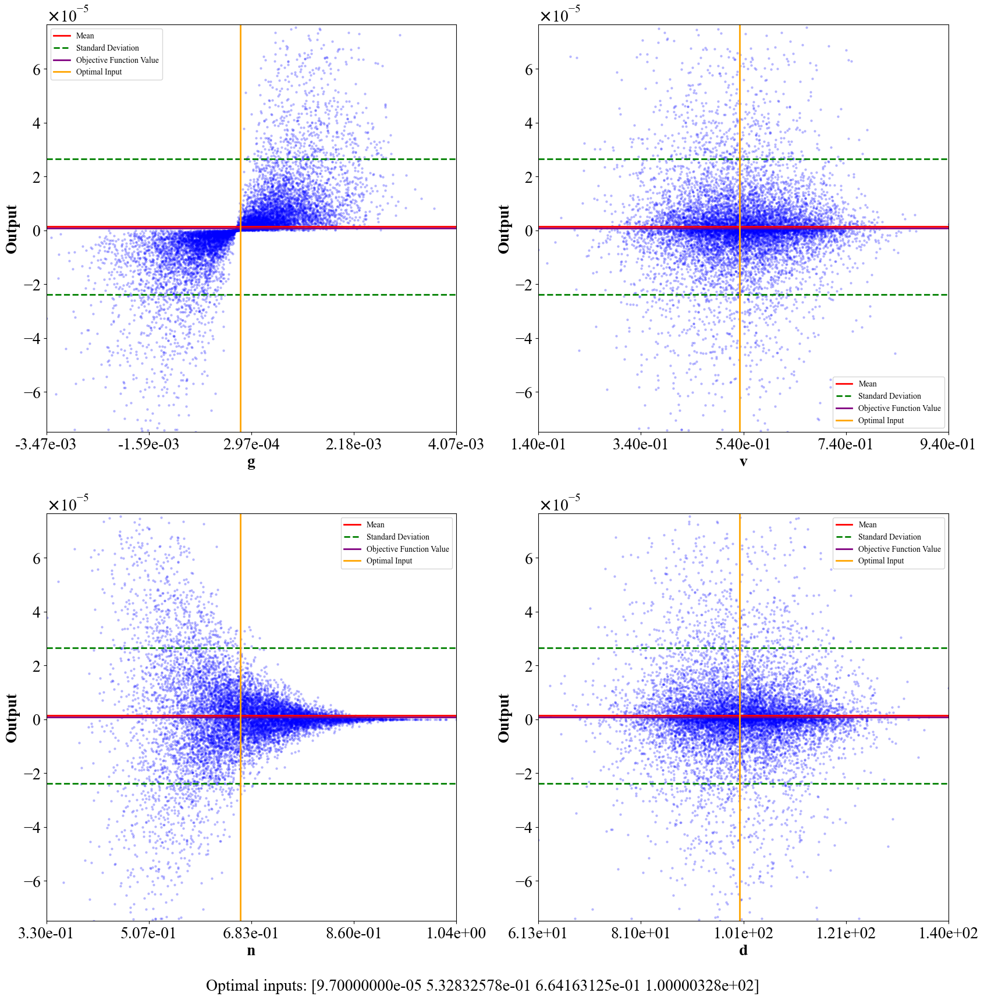

In [6]:
# Define the formula as a symbolic function
formula = ['g/(v*8.3e-3*((n^3)/((1-n)^2))*((d)^2))']
model = ot.SymbolicFunction(['g', 'v', 'n', 'd'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(9.7e-5, 4.9e-3), # density of water
          (0.328, 0.935), # slope
          (0.328, 0.935), # density of the sediment
          (1, 365)] # grain size

# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1, 0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]

print("Mean: ", mean)
print("Standard deviation: ", std_dev)

# Define the variable names
variable_names = ['g', 'v', 'n', 'd']

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20, weight='bold')
    ax.set_ylabel('Output', fontsize=20, weight='bold')
    ax.grid(False)
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-3*std_dev, result.fun+3*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add a common legends
    ax.legend(fontsize=10,loc='best')

# Add a title
##fig.suptitle('Simulation Results', fontsize=24, y=0.93)

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()

Optimal inputs: [2.20000000e-04 5.00000000e-01 9.90000000e-01 3.52000000e+00
 9.85920001e+00]
Objective function value: 7.757881014590153e-06
Mean:  0.0019076453153650513
Standard deviation:  0.03380860999578723


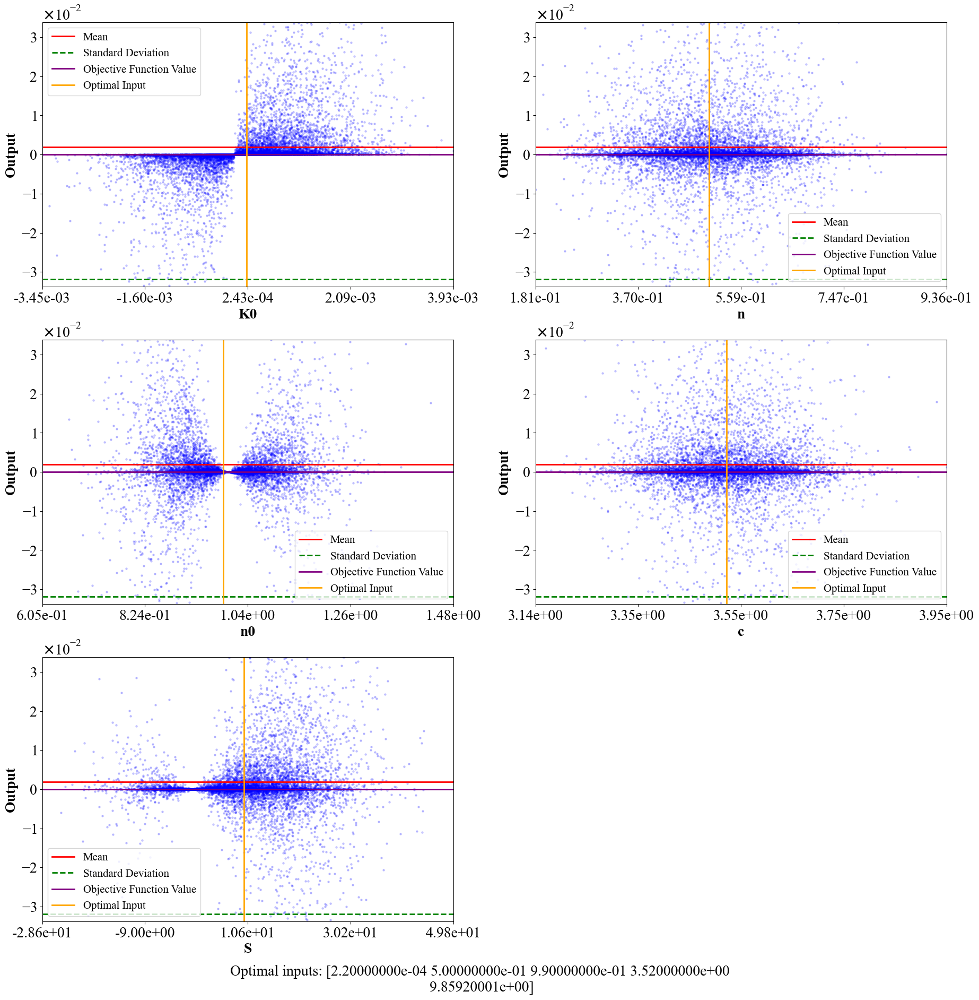

In [5]:
# Xi-lia Zheng et al., 2014

# Define the formula as a symbolic function
formula = ['(K0 * ((n*n*n)/((1-n)*(1-n)))*(((1-n0)*(1-n0))/(n0*n0*n0)))/((n*n*n) / (c * ((1 - n)*(1 - n)) * (S*S)))']
model = ot.SymbolicFunction(['K0', 'n', 'n0', 'c', 'S'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(2.2e-4, 1e-3),  # initial saturated permeability coefficient before recharge during recharge [m/d]
          (0.5, 0.99),  # porosity of the sand media [-]
          (-3, 0.99),  # initial porosity of aquifer media [-]
          (3.52, 402),  # Korenzy constant based on solid volume
          (1, 10)]  # Specific surface area based on solid volume
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 0.5, 0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1, 0.1, 0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]

print("Mean: ", mean)
print("Standard deviation: ", std_dev)

# Define the variable names
variable_names = ['K0', 'n', 'n0', 'c', 'S']

# Create subplots
fig, axs = plt.subplots(3, 2, figsize=(22, 22))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20, weight='bold')
    ax.set_ylabel('Output', fontsize=20, weight='bold')
   
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-1*std_dev, result.fun+1*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15,loc='best')

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])

# Add a title
##fig.suptitle('Simulation Results', fontsize=30, y=0.98)

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()

Optimal inputs: [402.   1.  -3.]
Objective function value: -678.375
Mean:  10555.017539301498
Standard deviation:  457913.05114513147


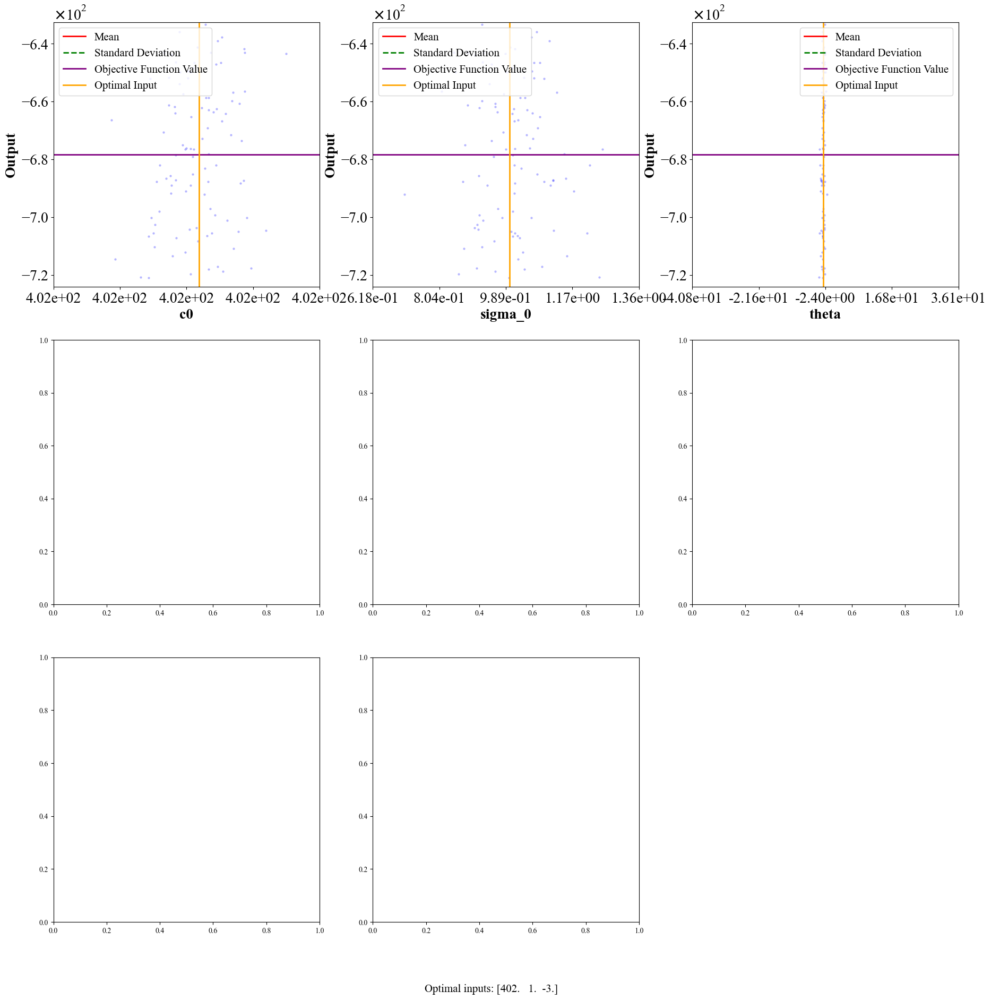

In [9]:
# Schulz, Raphael (2020)

# Define the formula as a symbolic function
formula = ['(c0/(sigma_0*sigma_0))*((theta*theta*theta)/((1-theta)*(1-theta)))']
model = ot.SymbolicFunction(['c0', 'sigma_0', 'theta'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(3.52, 402), # Korenzy constant 
          (1, 10), # specific surface with respect to the unit volume of the solid matrix
          (-3, 0.99)] #  porosity
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]

print("Mean: ", mean)
print("Standard deviation: ", std_dev)

# Define the variable names
variable_names = ['c0', 'sigma_0', 'theta']

# Create subplots
fig, axs = plt.subplots(3, 3, figsize=(22, 22))
axs = axs.ravel()
for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20, weight='bold')
    ax.set_ylabel('Output', fontsize=20, weight='bold')
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-0.0001*std_dev, result.fun+0.0001*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15,loc ='best')

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])

# Add a title
##fig.suptitle('Simulation Results', fontsize=24, y=0.93)

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=15)

# Show the plot
plt.show()

Optimal inputs: [9.144e-01 1.000e+01 1.500e+00 1.000e-02 4.000e+02 1.000e-01 9.000e+01
 1.000e+01 1.300e+02]
Objective function value: 4.938994748687171
Mean:  4.899733406599608
Standard deviation:  4.961840686145997


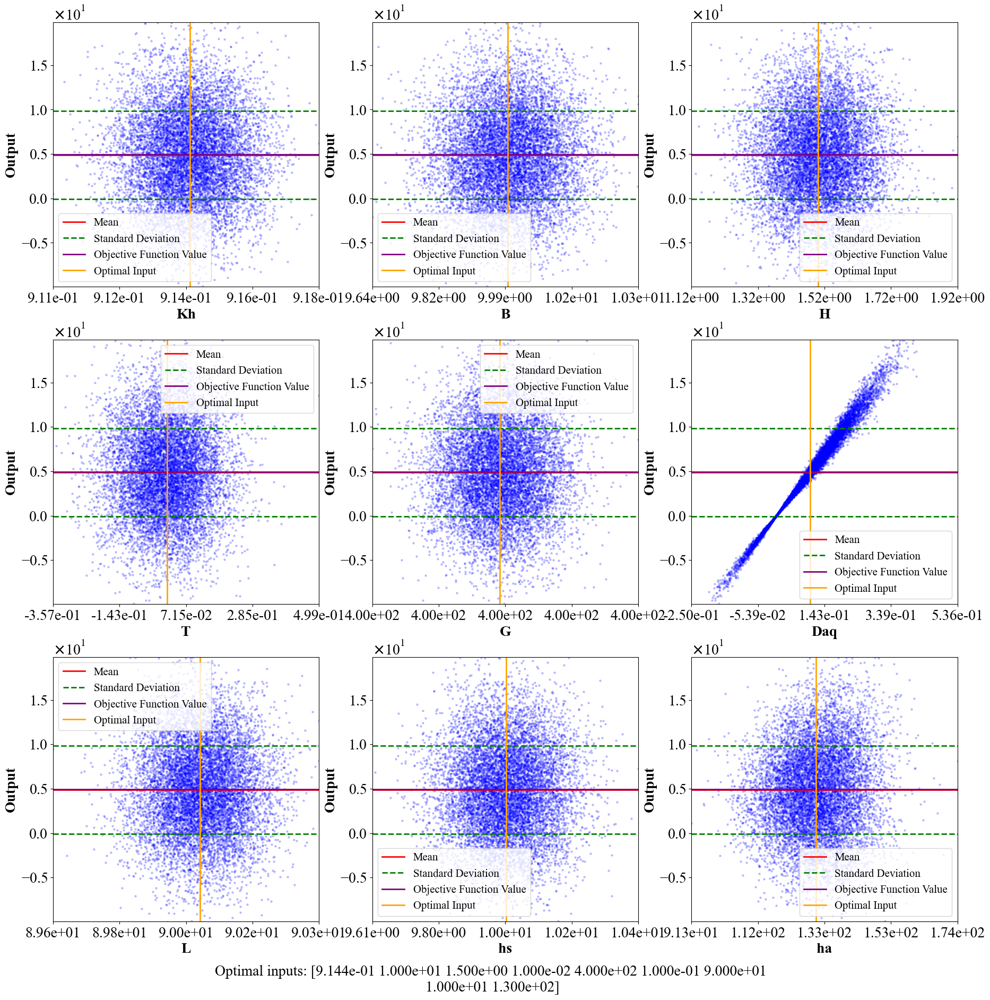

In [5]:
# Hubert J. Morel-Seytoux et al., 2016

# Define the formula as a symbolic function
formula = ['(((2*Kh)/(B+H))*(T/((1-(G/Daq))*T)))*(L*(B+H)*(hs-ha))']
model = ot.SymbolicFunction(['Kh', 'B', 'H', 'T', 'G', 'Daq', 'L', 'hs', 'ha'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(0.9144, 457.2), #  horizontal hydraulic conductivity
          (10, 250), #  half width of the river
          (1.5, 7), # depth of water in river from water surface to streambed
          (1e-4, 1e-2), # clogging  layer  correction
          (90, 400), # Grid size
          (0.1, 5145), # Aquifer thickness
          (90, 400), #  length of the river reach within the river cell
          (1, 10), # head in river
          (130, 270)] #  head in aquifer] #  porosity
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]


print("Mean: ", mean)
print("Standard deviation: ", std_dev)


# Define the variable names
variable_names = ['Kh', 'B', 'H', 'T', 'G', 'Daq', 'L', 'hs', 'ha']

# Create subplots
fig, axs = plt.subplots(3, 3, figsize=(22, 22))
axs = axs.ravel()
for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20,weight='bold')
    ax.set_ylabel('Output', fontsize=20, weight='bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-3*std_dev, result.fun+3*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc = 'best')

# Add a title
##fig.suptitle('Simulation Results', fontsize=24, y=0.93)

fig.subplots_adjust(wspace=0.2)
fig.subplots_adjust(hspace=0.2)

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()


Optimal inputs: [1.70000000e-02 1.00000000e+01 7.00000000e+00 1.00000000e-02
 2.41659474e+02 1.00000000e-01 9.00090941e+01 1.30000000e+02]
Objective function value: 0.0017084176987646777
Mean:  4.038400474312538e-05
Standard deviation:  0.010220628287444482
Min:  -0.3023496907949475
Max:  0.5308686700348918


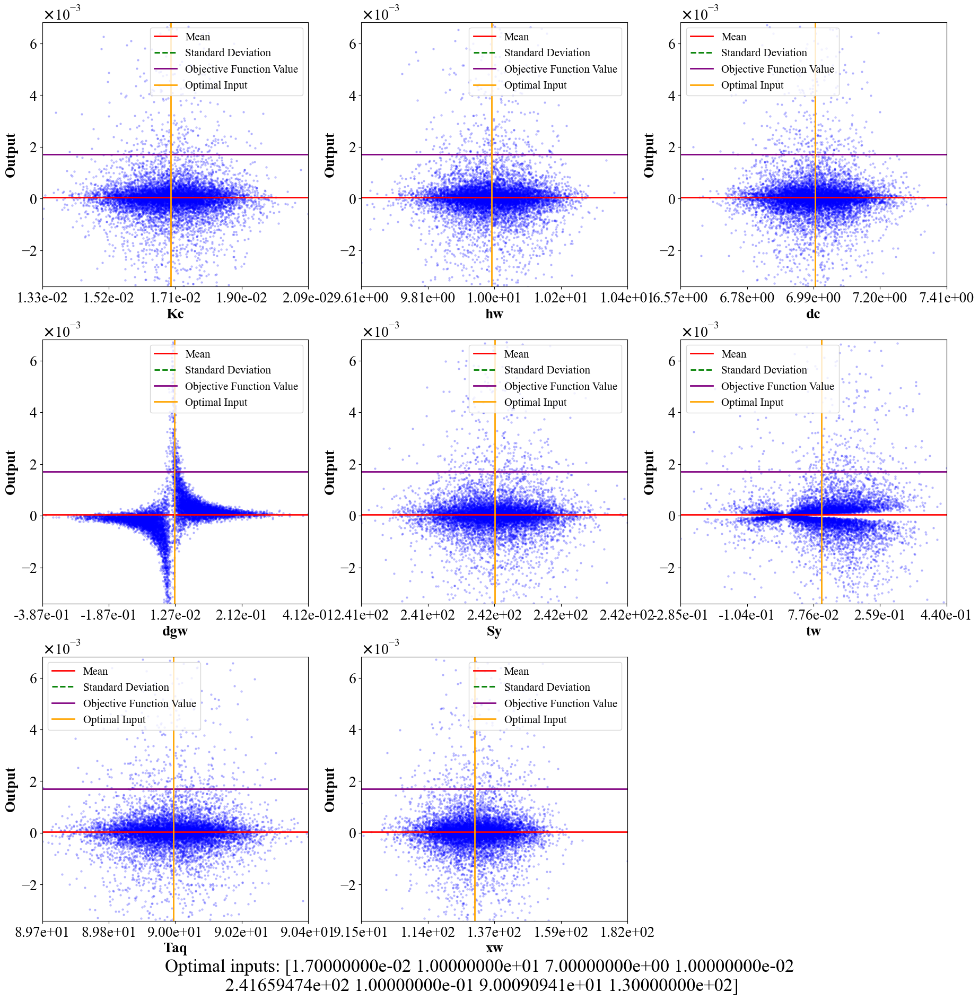

In [5]:
# Rebecca C. Doble et al., 2012

# Define the formula as a symbolic function
formula = ['(Kc(hw + dc))/(dc*dgw*((Sy/tw)+((2*Taq)/(xw*xw))))']
model = ot.SymbolicFunction(['Kc', 'hw', 'dc', 'dgw', 'Sy', 'tw', 'Taq', 'xw'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(0.017, 7.13), #  Saturated hydraulic conductivity of the surface soil or clogging layer [LT-1]
          (10, 250), #  height of the wave above the bankfull elevation
          (1.5, 7), # Thickness of the clogging layer
          (1e-4, 1e-2), # depth of groundwater = taken at the centre of the flood wave extent
          (90, 400), # Aquifer specific yield
          (0.1, 5145), # duration of the flood wave
          (90, 400), #  Aquifer transmissivity
          (130, 270)] # lateral extent of flooding
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1, 0.1, 0.1, 0.1,0.1, 0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['Kc', 'hw', 'dc', 'dgw', 'Sy', 'tw', 'Taq', 'xw']

# Create subplots
fig, axs = plt.subplots(3, 3, figsize=(22, 22))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20, weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight = 'bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-0.5*std_dev, result.fun+0.5*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc ='best')

# Add a title
##fig.suptitle('Simulation Results', fontsize=24, y=0.91)

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])

fig.subplots_adjust(wspace=0.2)
fig.subplots_adjust(hspace=0.2)

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=25)

# Show the plot
plt.show()

Optimal inputs: [1.0000000e-05 1.0000004e+00 3.6300000e-01 1.1000000e-05 1.0000000e+02]
Objective function value: 9.996007795502564e-06
Mean:  -0.7882908313646659
Standard deviation:  302.4743439904617
Min:  -15793.691262555392
Max:  17224.11275742273


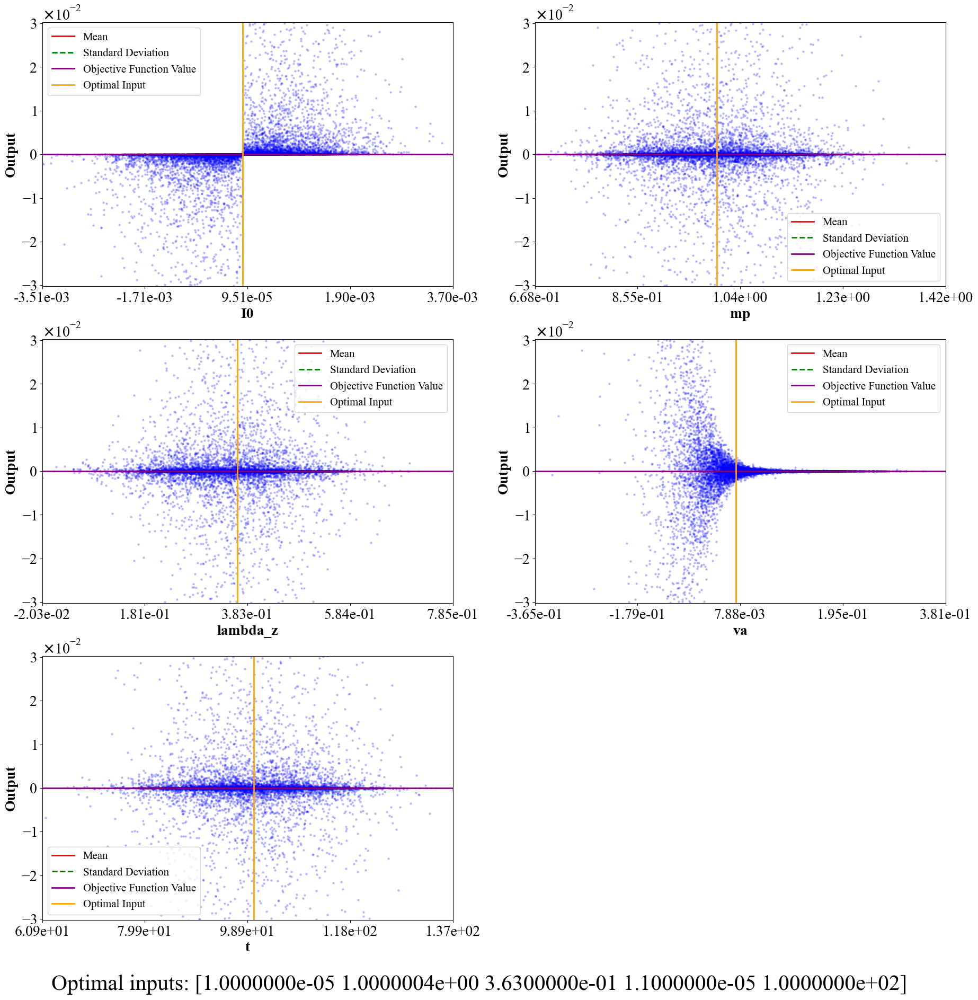

In [10]:
# Pedretti et al. 2012

# Define the formula as a symbolic function
formula = ['I0 * (2.7182818285^(-(mp * lambda_z * va * t)))']
model = ot.SymbolicFunction(['I0', 'mp', 'lambda_z', 'va', 't'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(1e-5, 0.002), # Infiltration capacity [LT-1]
          (1, 100), # coefficient of proportionality [-]
          (0.044, 0.363), # Filtration coefficient [L-1]
          (1e-5, 1.1e-5), # Average particle attachment velocity to the soil matrix
          (1, 365)] # time
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 0.5, 0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1, 0.1, 0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['I0', 'mp', 'lambda_z', 'va', 't']

# Create subplots
fig, axs = plt.subplots(3, 2, figsize=(22, 22))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20, weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight = 'bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-0.0001*std_dev, result.fun+0.0001*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
##fig.suptitle('Simulation Results', fontsize=24, y=0.9)

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])


# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=30)

# Show the plot
plt.show()

Optimal inputs: [1.86e+03 1.00e-03 1.30e+02 9.00e+01]
Objective function value: 118899720.58495305
Mean:  119033058.55688938
Standard deviation:  13309121.912361676
Min:  71631973.9914248
Max:  164825382.66579342


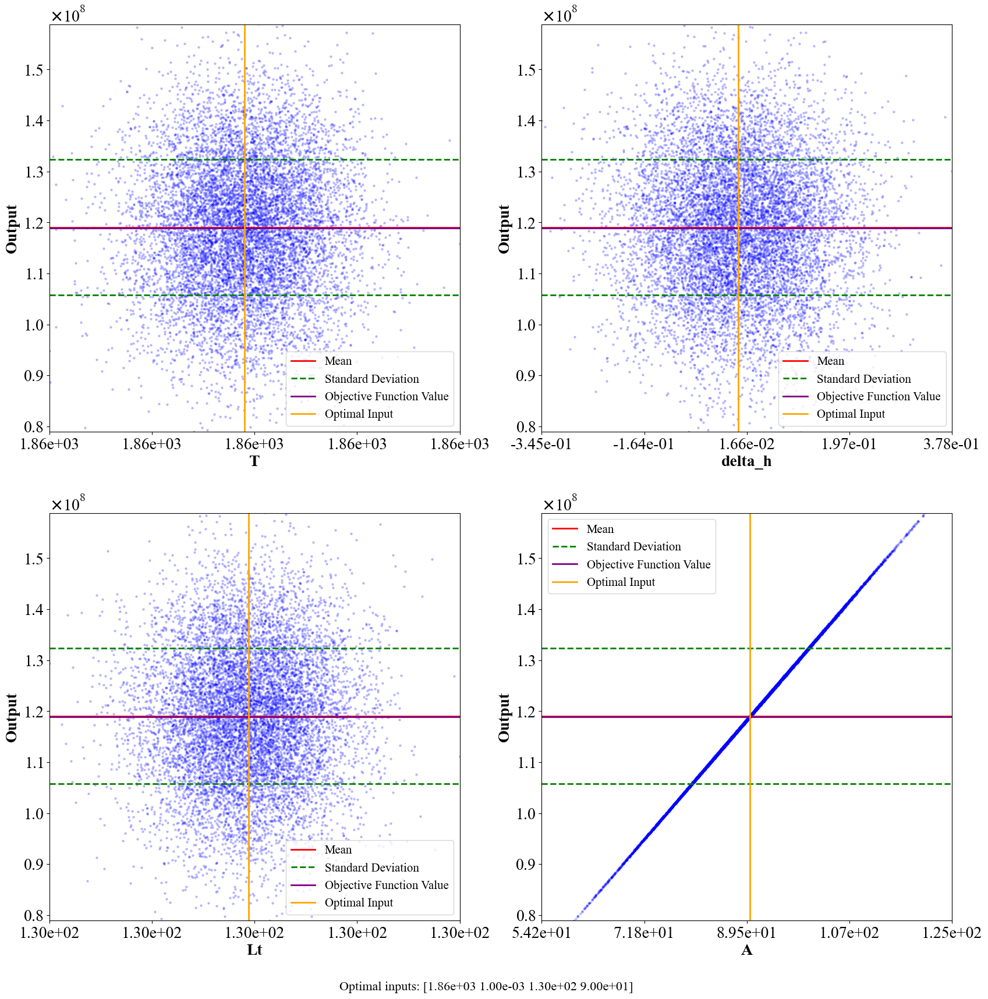

In [8]:
# Jung-Woo Kim et al., 2009

# Define the formula as a symbolic function
formula = ['((T*(4*3.141592654*delta_h))/2.3)/(delta_h/(Lt*A))']
model = ot.SymbolicFunction(['T', 'delta_h', 'Lt', 'A'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(1860, 2240), # Transmissivity
          (0.001, 4.1), # hydraulic head loss [mm]
          (130, 270),# length of the glass bead layer [mm]
          (90, 400)] # cross-sectional area of the glass bead layer [mm2]
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1, 0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['T', 'delta_h', 'Lt', 'A']

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20, weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight = 'bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-3*std_dev, result.fun+3*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
##fig.suptitle('Simulation Results', fontsize=24, y=0.951)

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=16)

# Show the plot
plt.show()

Optimal inputs: [ 1.   0.1  1.  10. ]
Objective function value: -2.446453152
Mean:  -2.465818821255556
Standard deviation:  4.516685222075532
Min:  -34.978496096583775
Max:  15.577881326889537


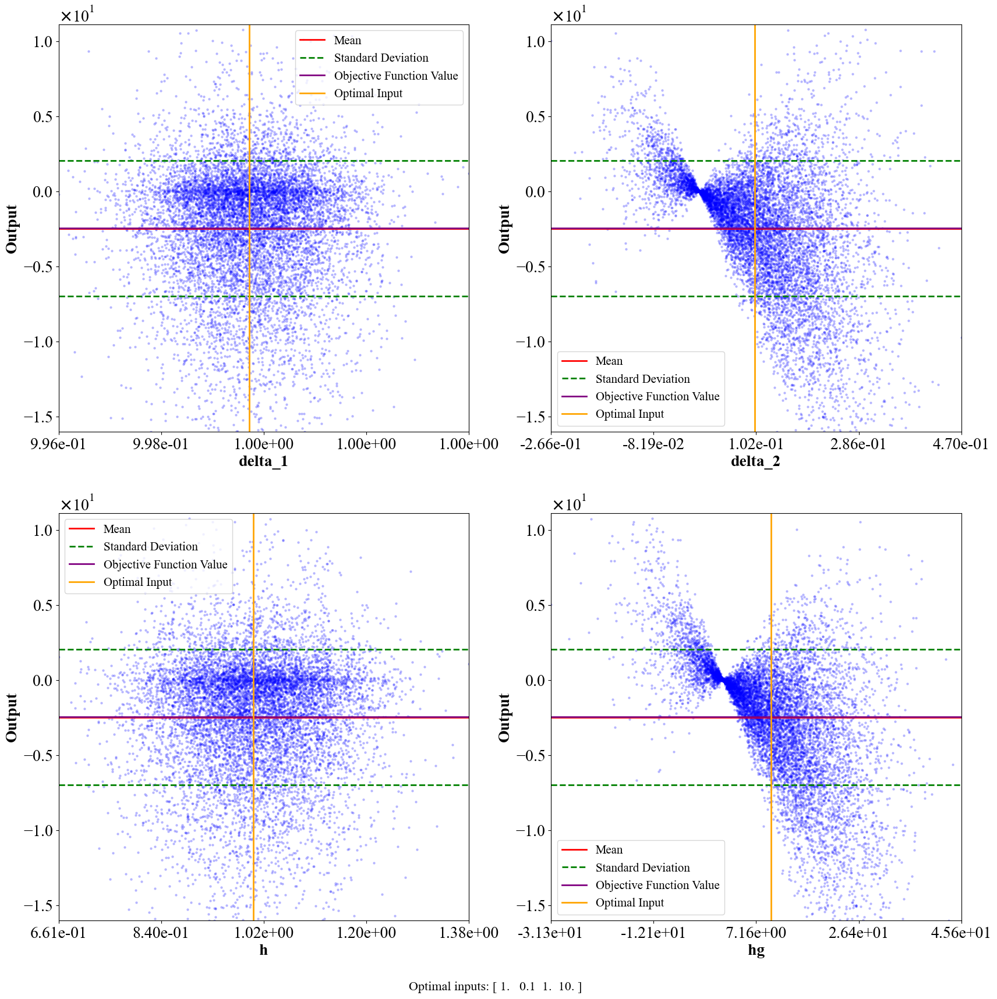

In [9]:
# Jena-Olaf Delfs 2011

# Define the formula as a symbolic function
formula = ['delta_1*(2.71828128*(delta_2*(h-hg)))']
model = ot.SymbolicFunction(['delta_1', 'delta_2', 'h', 'hg'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(1e-1, 1), # Λ1 and Λ2 are parameters and implemented into OGS code.
          (0.005, 0.1), 
          (1, 5), # h = H + b the water height in the river
          (1, 10)] # water table height
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1, 0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['delta_1', 'delta_2', 'h', 'hg']

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20, weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight = 'bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-3*std_dev, result.fun+3*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
##fig.suptitle('Simulation Results', fontsize=24, y=0.915)

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=16)

# Show the plot
plt.show()

Optimal inputs: [0.143 6.282]
Objective function value: -42.93006993006993
Mean:  -43.482100299897
Standard deviation:  69.80854662106364
Min:  -336.4253554407177
Max:  224.52365059222066


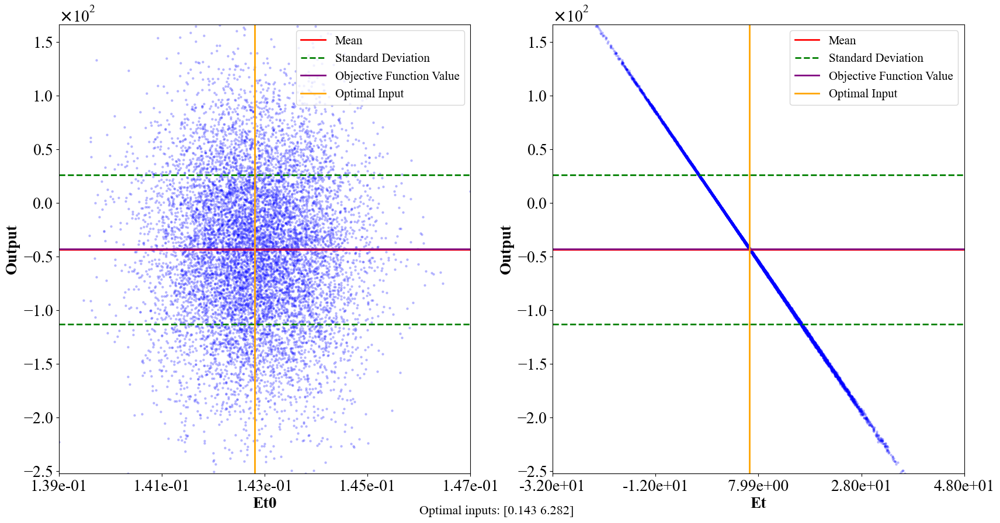

In [10]:
# Xuezhen Zhang et al., 2020

# Define the formula as a symbolic function
formula = ['(Et0 - Et)/Et0']
model = ot.SymbolicFunction(['Et0', 'Et'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(0.143, 1.194), # initial water absorbing capacity
          (6.056, 6.282)] # water absorbing capacity at time t
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['Et0', 'Et']

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20, weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight = 'bold')
  
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-3*std_dev, result.fun+3*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc ='best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.925)

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.04, f"Optimal inputs: {result.x}", ha='center', fontsize=16)

# Show the plot
plt.show()

Optimal inputs: [0.004992   1.         4.31557523 4.1       ]
Objective function value: 2.080958711265815e-05
Mean:  2.30165348324612e-05
Standard deviation:  0.0018342306421228612
Min:  -0.023100792060585653
Max:  0.16424208717097433


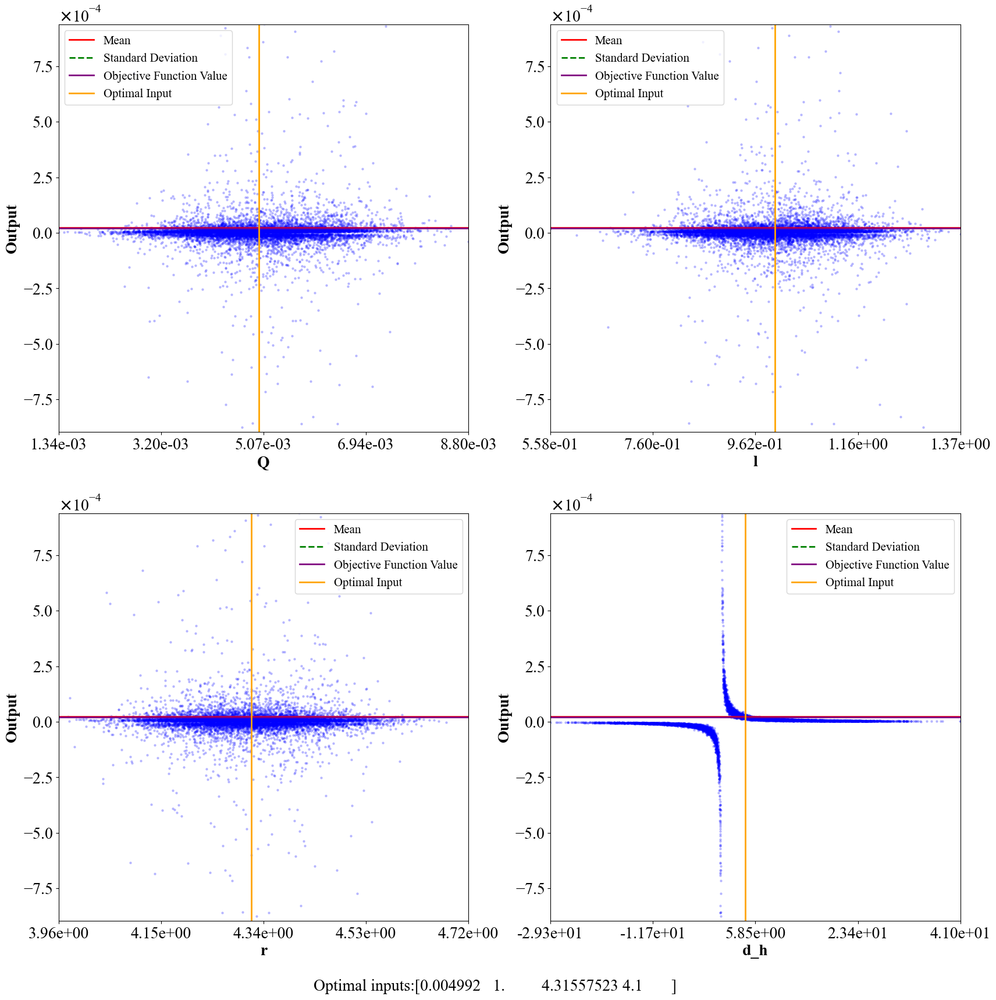

In [11]:
#Xinqiang Du et al., 2014

# Define the formula as a symbolic function
formula = ['(Q*l)/(3.141592654*(r^2)*d_h)']
model = ot.SymbolicFunction(['Q', 'l', 'r', 'd_h'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(0.004992, 840), # flow rate [m3d-1]
          (1, 10), # distance between any two piezometric tubes along the column [m]
          (1, 5), # Inner diameter of the column [m]
          (0.001, 4.1)] #  hydraulic head difference at a difference l [m]
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1, 0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['Q', 'l', 'r', 'd_h']

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20, weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight = 'bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-0.5*std_dev, result.fun+0.5*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc= 'best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.91)

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs:{result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()

Optimal inputs: [1.5  0.18 0.99]
Objective function value: 0.8938148015731141
Mean:  0.9503309612475709
Standard deviation:  60.93887759947844
Min:  -1129.4666177921897
Max:  5664.779191326282


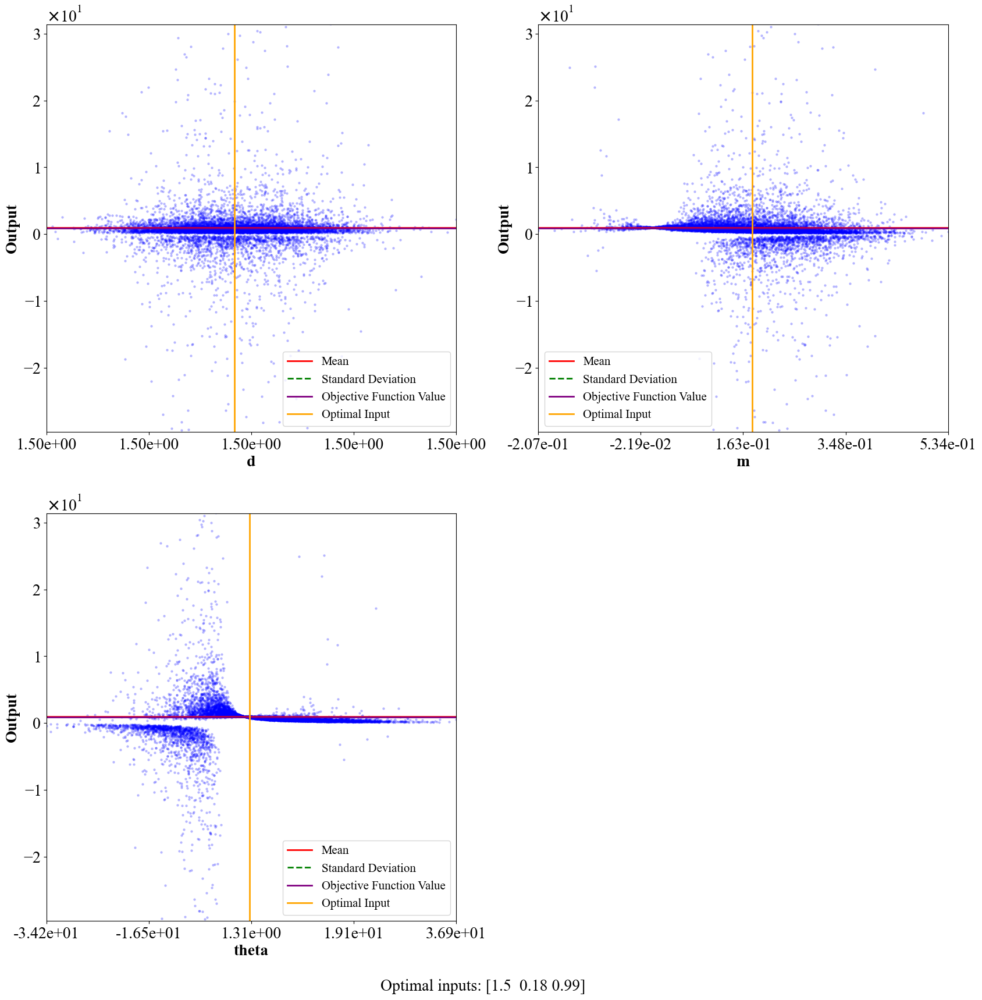

In [12]:
# Kristin J. Rehg et al., 2004
# Define the formula as a symbolic function
formula = ['d/((m*theta)+d)']
model = ot.SymbolicFunction(['d', 'm', 'theta'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(1.5, 10.87), # effective stream depth (total volume of stream water per unit bed area)
          (0, 0.18), # average depth of solute penetration into the bed
          (-3, 0.99)] # bulk porosity
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['d', 'm', 'theta']

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20, weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight = 'bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-0.5*std_dev, result.fun+0.5*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.91)

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])


# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()

Optimal inputs: [10. -3.  1.]
Objective function value: -30.0
Mean:  5.323640671458455
Standard deviation:  268.81525577885867
Min:  -6182.302242232541
Max:  18434.800900666978


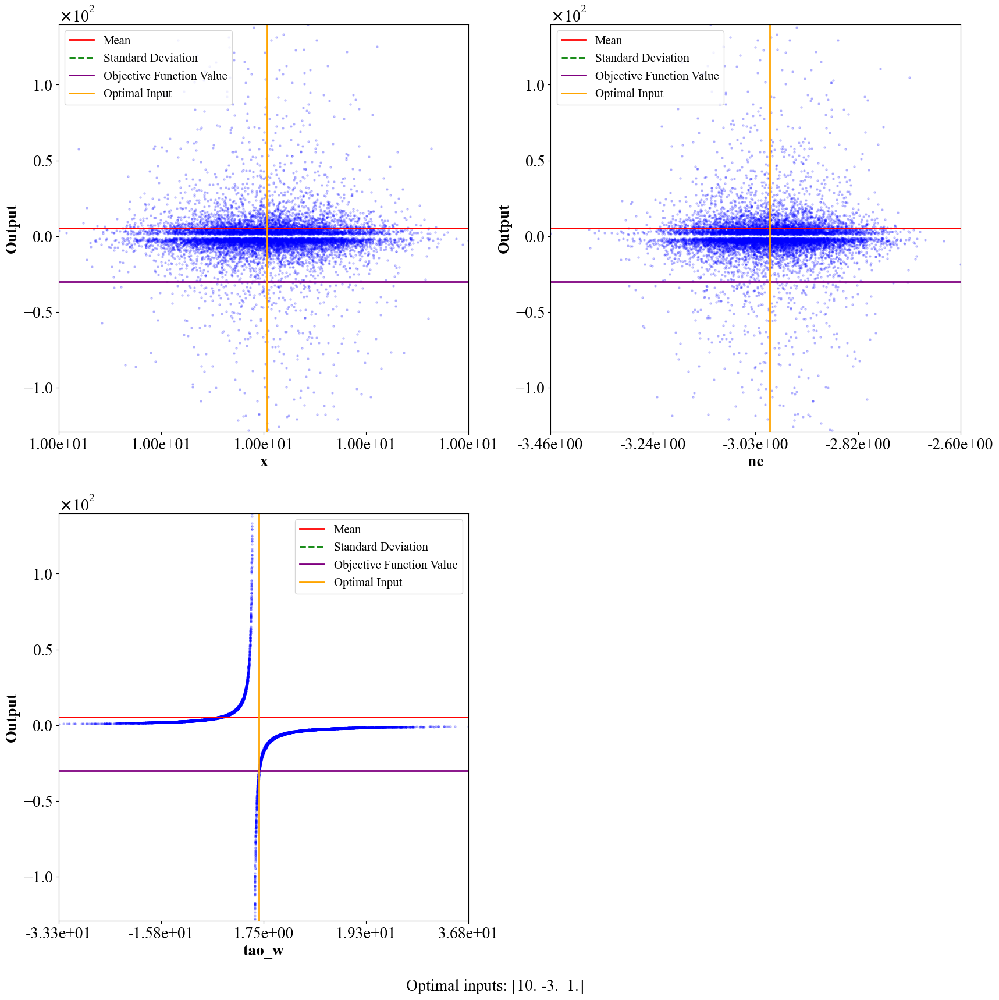

In [13]:
# E. Hoehn et al., 2006
# Define the formula as a symbolic function
formula = ['(x*ne)/tao_w']
model = ot.SymbolicFunction(['x', 'ne', 'tao_w'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(1, 10), # path length from the infiltration point in the river to a nearby monitoring well
          (-3, 0.99), # flow-effective porosity of the riverbed and aquifer materials
          (1, 365)] # mean residence time of freshly infiltrated water
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['x', 'ne', 'tao_w']

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20, weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight = 'bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([mean-0.5*std_dev, mean+0.5*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.91)

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])


# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()

Optimal inputs: [1.e-12 1.e+00 5.e+01]
Objective function value: 2e-14
Mean:  -7.831466850684077e-08
Standard deviation:  2.1381953342136744e-05
Min:  -0.00010347600129636941
Max:  9.992422068119387e-05


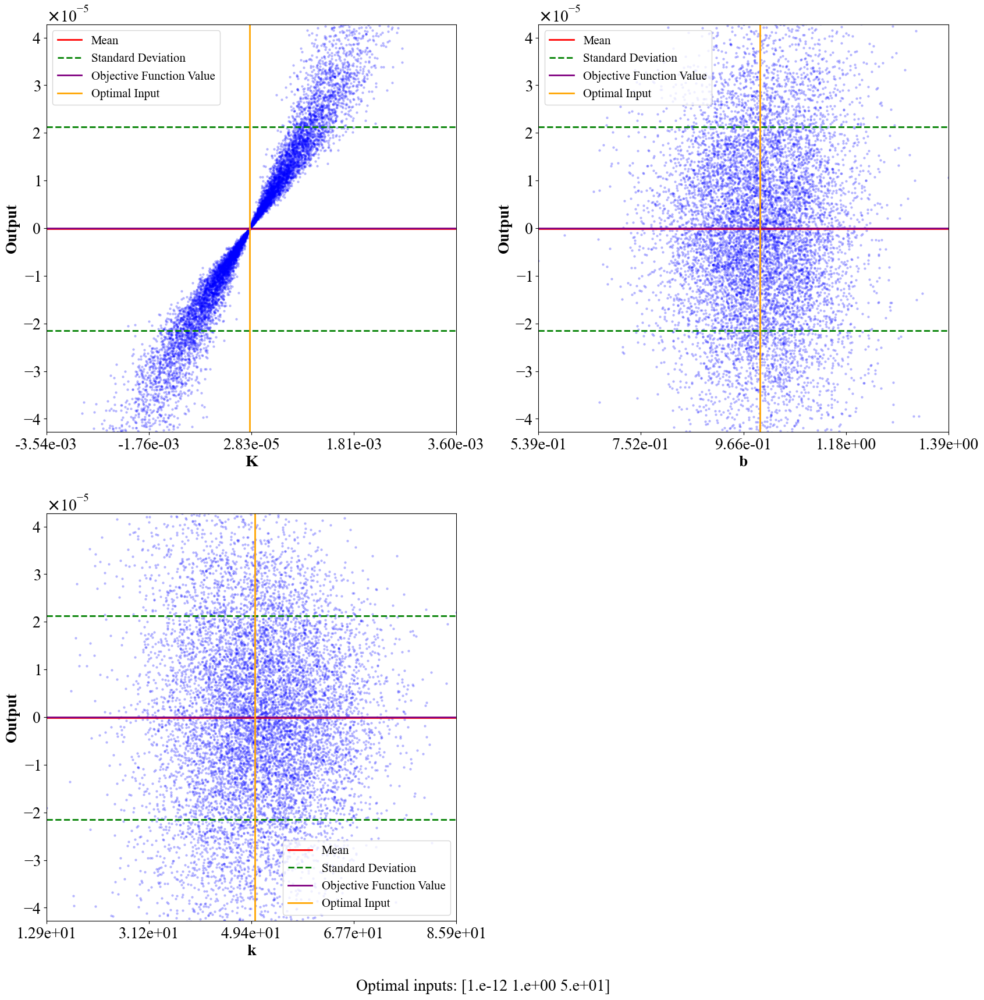

In [14]:
#Konstantinos N. Moutsopoulos 2013
# Define the formula as a symbolic function
formula = ['(K*b)/k']
model = ot.SymbolicFunction(['K', 'b', 'k'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(1e-12, 1e0), # hydraulic conductivity of the aquifer 
          (1, 10), # length of the base of semipervious layer of rectangular shape
          (0.1, 50)] # the hydraulic conductivity of the clogging layer (m/d).
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['K', 'b', 'k']

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20, weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight ='bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-2*std_dev, result.fun+2*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.91)

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()

Optimal inputs: [ 9.0e-01  1.0e+00 -2.5e-01  2.0e-02  1.0e+02]
Objective function value: 0.6233577723372037
Mean:  1.6793437591093943
Standard deviation:  144.09348594606362
Min:  -134.49004380645158
Max:  14369.002686718133


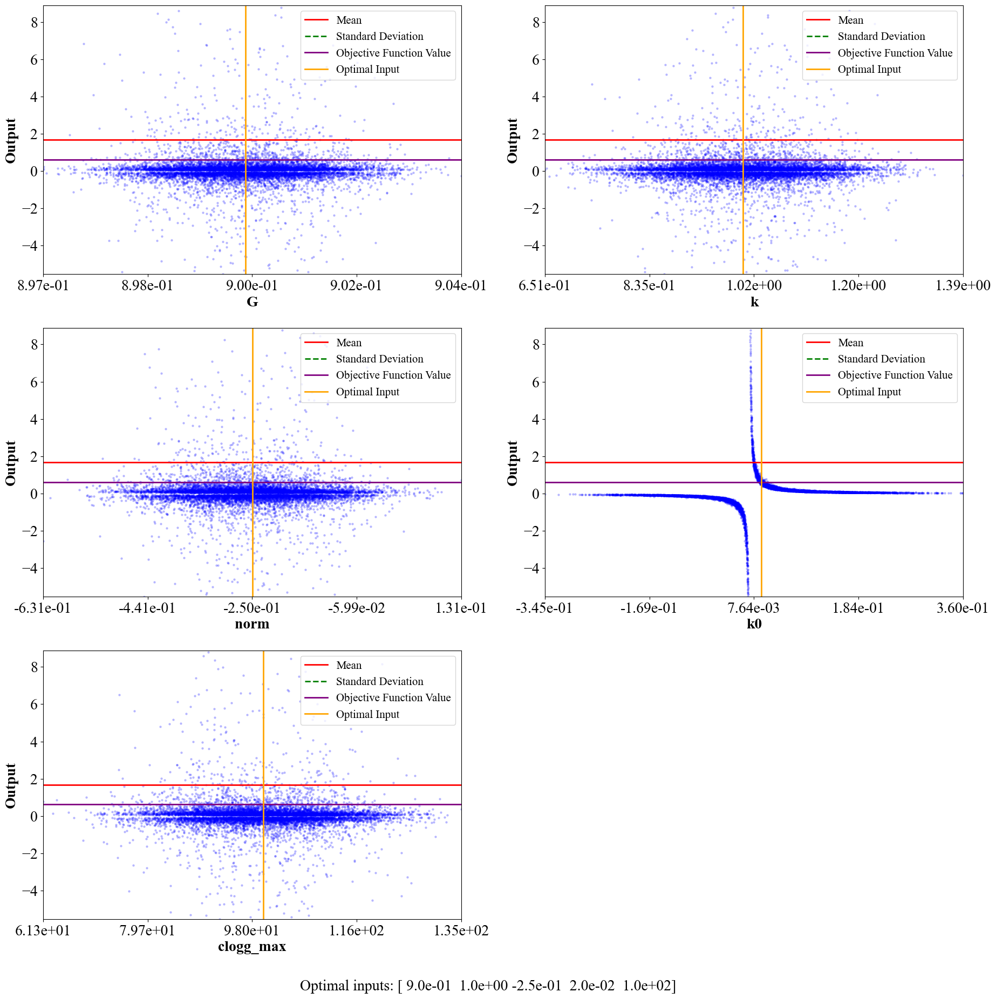

In [15]:
# Sebastian Rudnick et al., 2014
# Define the formula as a symbolic function
formula = ['1/(G*(1/(1+(2.718281828^(-k*G*norm))*((G/k0)-1)))*clogg_max)']
model = ot.SymbolicFunction(['G', 'k', 'norm', 'k0', 'clogg_max'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(0.9, 1), # soil heat-flux density (MJ/[m2*d]),
          (1, 12), # hydraulic gradients
          (-0.26, -0.25), # vertical hydraulic gradient of the cell normalized by the steepest negative gradient of −0.25 m/m
          (0.01, 0.02), # hydraulic gradient at 0
          (1, 100)] # cloggmax is the maximum assumed clogging factor of 100 (–)
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 0.5, 0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1,0.1,0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['G', 'k', 'norm', 'k0', 'clogg_max']

# Create subplots
fig, axs = plt.subplots(3, 2, figsize=(22, 22))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20,weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight='bold')
   
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([mean-0.05*std_dev, mean+0.05*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.9)

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()

Optimal inputs: [1.5e+00 2.0e+00 4.0e+02 1.0e-12]
Objective function value: -200000000000000.0
Mean:  8.98135237037592
Standard deviation:  2902.8528815878885
Min:  -153225.05021682024
Max:  228026.0926002048


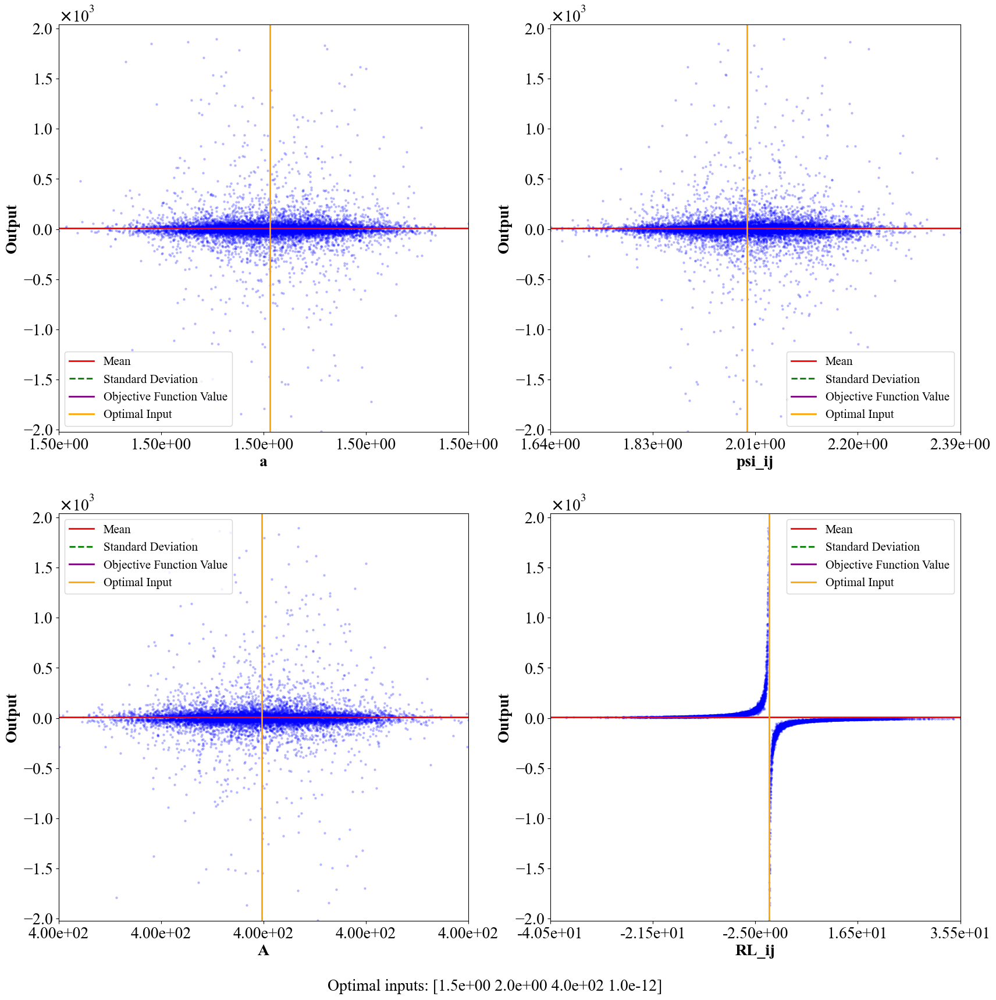

In [7]:
# Vassilios Kaleris 1998
# Define the formula as a symbolic function
formula = ['((a-psi_ij)*A)/(RL_ij)']
model = ot.SymbolicFunction(['a', 'psi_ij', 'A', 'RL_ij'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(1.5, 7), # water depth in the stream [m]
          (1, 2), # pressure head below the clogging layer [m]
          (90, 400), # stream bed area corresponding to the node (i j) = [m2]
          (1e-12, 1e0)] # hydraulic resistance of the clogging layer at the node (i, j) = [s-1]
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1,0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['a', 'psi_ij', 'A', 'RL_ij']

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20,weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight='bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([mean-0.7*std_dev, mean+0.7*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.91)

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()

Optimal inputs: [1.0e-01 1.1e-01 1.0e-03 1.0e+00 1.0e+00]
Objective function value: 0.0057119866436363695
Mean:  2.2048836693363136
Standard deviation:  201.99861424607428
Min:  -5254.69055987189
Max:  11321.308263233897


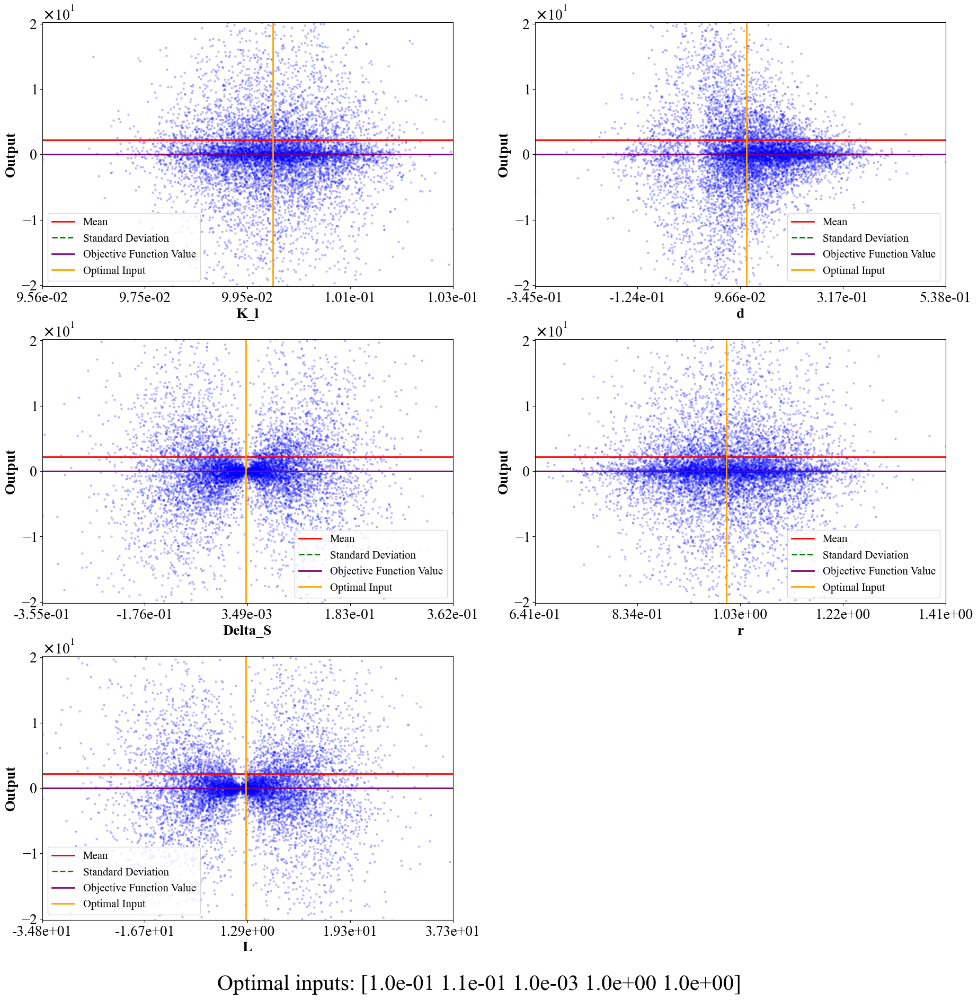

In [11]:
#M. Dimkic et al., 2011
# Define the formula as a symbolic function
formula = ['(K_l/d)*Delta_S*2*3.141592654*r*L']
model = ot.SymbolicFunction(['K_l', 'd', 'Delta_S', 'r', 'L'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(0.1, 50), #  Representative Values of the Coefficient of Local Hydraulic Losses at Well Laterals, KL /d conductivity of the well-lateral colmated layer [L T−1]
          (0.1, 0.11), # thickness of the colmated layer [L]
          (0.001, 4.1), # piezometric head drop at the colmated layer, the local drawdown
          (1, 5), # radius of the well lateral [L]
          (1, 10)] # length of the well lateral [L]
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 0.5, 0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1,0.1,0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['K_l', 'd', 'Delta_S', 'r', 'L']

# Create subplots
fig, axs = plt.subplots(3, 2, figsize=(22, 22))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20,weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight='bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-0.1*std_dev, result.fun+0.1*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.9)

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=30)

# Show the plot
plt.show()

Optimal inputs: [0.00000000e+00 4.09181819e-01 1.10000000e-01 9.99000000e+01
 1.00000000e+00 5.00000000e-03]
Objective function value: 0.0
Mean:  0.020218831392138016
Standard deviation:  71.21712651655947
Min:  -4231.08737640771
Max:  2096.615585536851


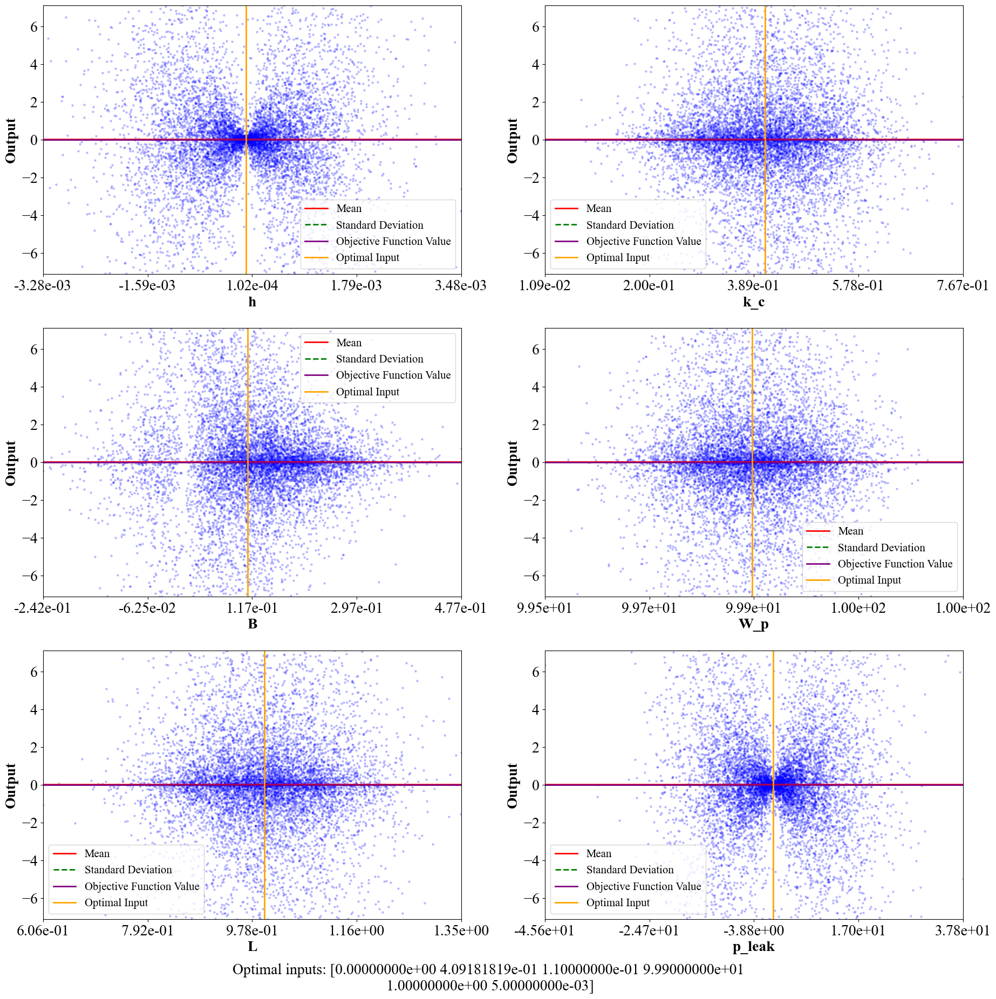

In [18]:
import openturns as ot
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize
# Hong Hanh Nguyen et al., 2021
# Define the formula as a symbolic function
formula = ['h*(k_c/B)*(W_p*L*p_leak)']
model = ot.SymbolicFunction(['h', 'k_c', 'B', 'W_p', 'L', 'p_leak'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(0, 0.1), # wastewater level in the pipe (L)
          (0.1, 50), # hydraulic conductivity of colmation layer (L T−1)
          (0.1, 0.11), # thickness of the colmation layer (L)
          (99.9, 99.999), # wetted perimeter generated with the water level in the sewer (L)
          (1, 10), # length of the sewer segment of interest (L)
          (0.005, 0.1)] # percentage of leaking surfaces from the total area under the wetted perimeter.
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 0.5, 0.5,0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1,0.1,0.1,0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['h', 'k_c', 'B', 'W_p', 'L', 'p_leak']

# Create subplots
fig, axs = plt.subplots(3, 2, figsize=(22, 22))
axs = axs.ravel()
for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20,weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight='bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-0.1*std_dev, result.fun+0.1*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.9)

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()

Optimal inputs: [1.00e-01 0.00e+00 1.10e-01 9.99e+01 1.00e+00 5.00e-03]
Objective function value: 0.0
Mean:  8.34811761666859
Standard deviation:  1692.900524938723
Min:  -46965.89612433074
Max:  87847.78857128415


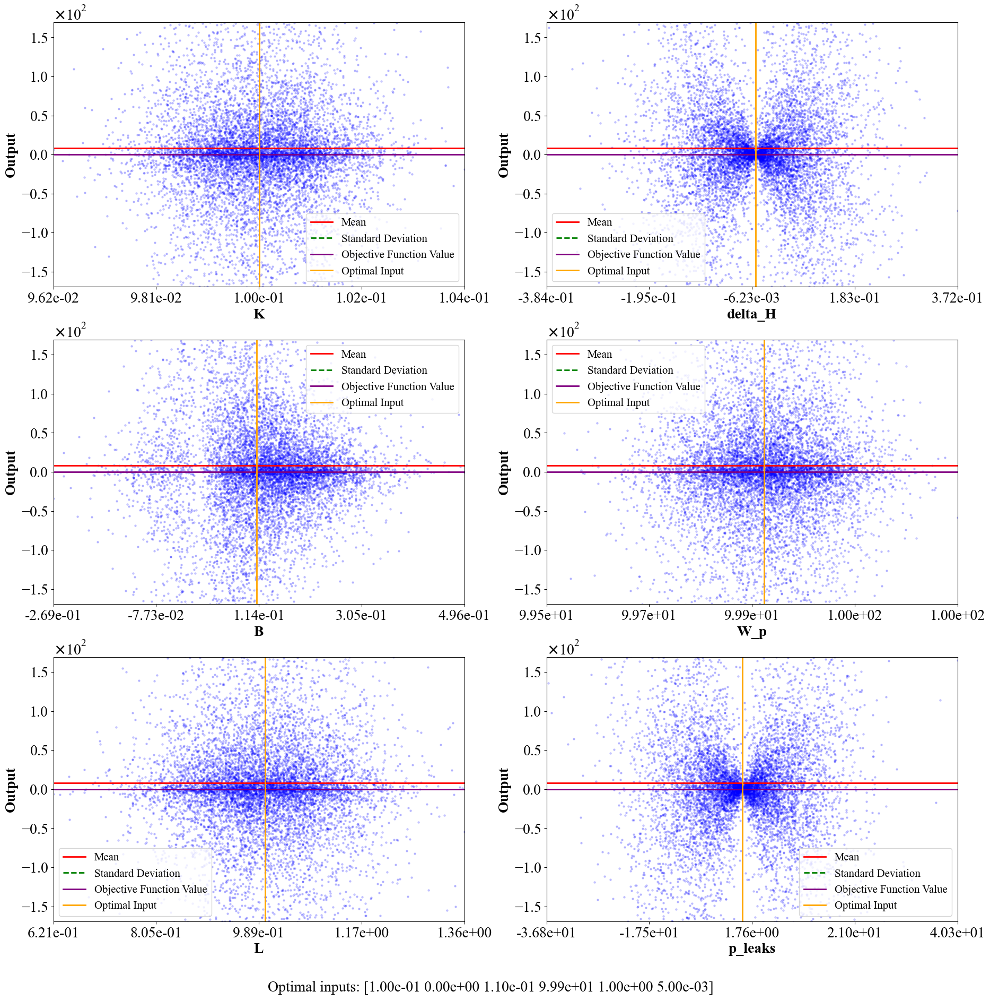

In [19]:
# Mohamed Amine Boukhemacha et al., 2015
# Define the formula as a symbolic function
formula = ['K*(delta_H/B)*(W_p*L*p_leaks)']
model = ot.SymbolicFunction(['K', 'delta_H', 'B', 'W_p', 'L', 'p_leaks'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(0.1, 50), # hydraulic conductivity of the clogging layer [m/day] = 0.15 – 33.09 (literature) = 7.34 – 29.37 (NEIMO calibration)
          (0, 0.1), # hydraulic head difference between the water level in the sewer and the hydraulic head of the surrounding groundwater (taken to be null) [m]
          (0.1, 0.11), # thickness of the clogging layer [m] = 0.1
          (99.9, 99.999), # wetted parameter
          (1, 10), # length
          (0.005, 0.1)] # percentage of the leaky area from the total area generated by the wetted perimeter
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 0.5, 0.5,0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1,0.1,0.1,0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['K', 'delta_H', 'B', 'W_p', 'L', 'p_leaks']

# Create subplots
fig, axs = plt.subplots(3, 2, figsize=(22, 22))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20,weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight='bold')
 
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-0.1*std_dev, result.fun+0.1*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.9)

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()

Optimal inputs: [   1.    5. 1000.    1.]
Objective function value: -400000.0
Mean:  -118002.24549777158
Standard deviation:  6686197.48698642
Min:  -562900347.3674372
Max:  77789528.73739453


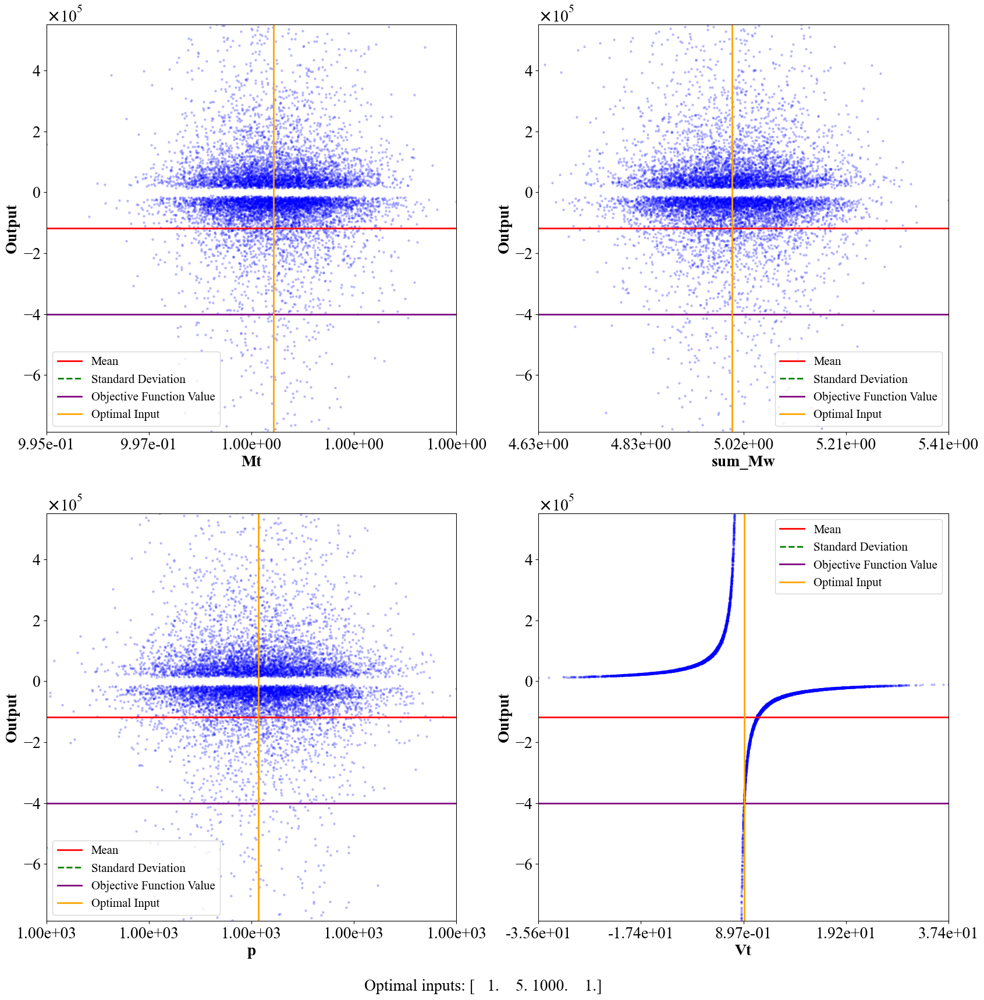

In [20]:
# Stephane Descloux et al., 2010
# Define the formula as a symbolic function
formula = ['(((Mt-sum_Mw)*p)/Vt)*100']
model = ot.SymbolicFunction(['Mt', 'sum_Mw', 'p', 'Vt'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(1, 10), # Total mass of sample core [kg]
          (1, 5), # Mass of wet sediments
          (999.9, 1000), # Water density [kg/m3] = 1000
          (1, 10)] #  Total volume of sample core
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1,0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['Mt', 'sum_Mw', 'p', 'Vt']

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20,weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight='bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([mean-0.1*std_dev, mean+0.1*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.9)

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()

Optimal inputs: [4.99200000e-03 3.00000000e-03 5.65000319e+00 4.10000000e+00]
Objective function value: 6.464921888858341e-07
Mean:  6.11574919324176e-06
Standard deviation:  0.0013625504964614222
Min:  -0.05658226344702626
Max:  0.10208995964707514


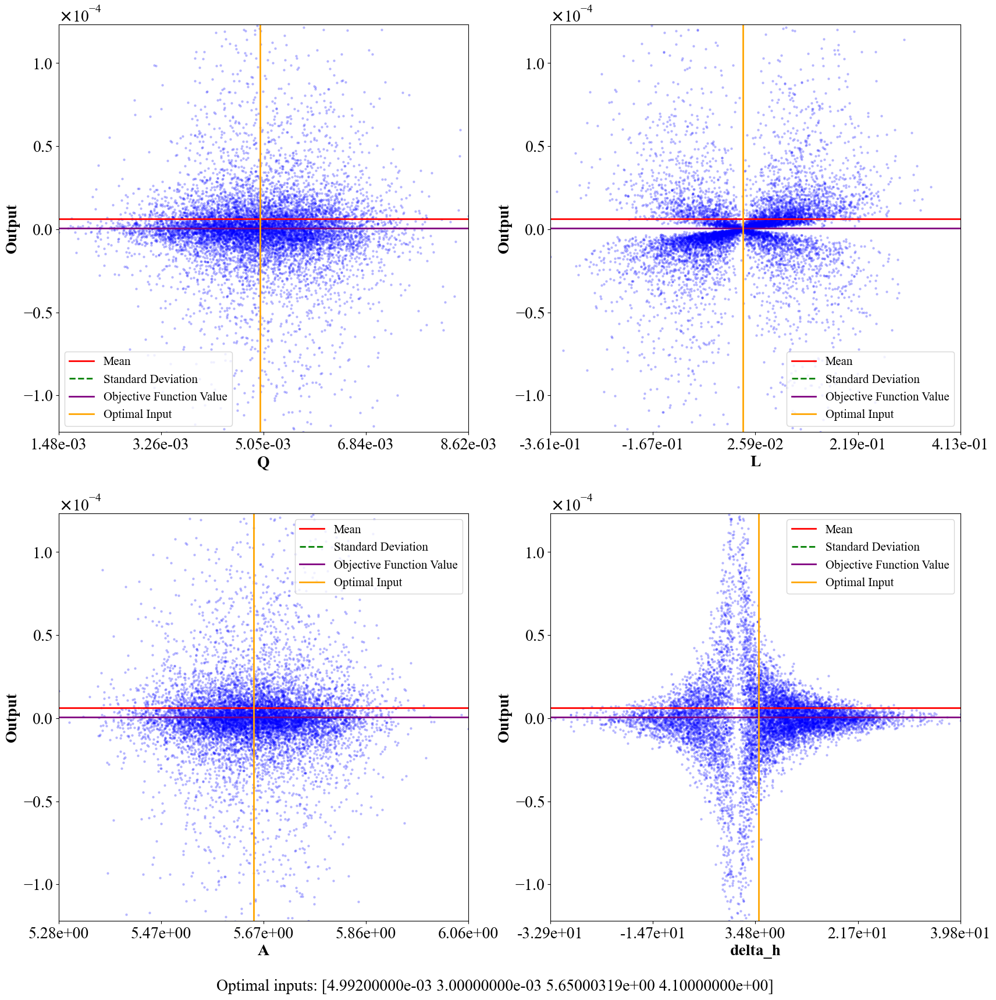

In [21]:
# K. Pholkern et al., 2015
# Define the formula as a symbolic function
formula = ['(Q*L)/(A*delta_h)']
model = ot.SymbolicFunction(['Q', 'L', 'A', 'delta_h'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(0.004992, 840), # Outflow / Infiltration discharge [m3/s]
          (0.003, 0.006), #Thickness of clogging layer
          (5.65, 237.56), # Area of flow [m2]
          (0.001, 4.1)] #  Head difference [m]
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1,0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['Q', 'L', 'A', 'delta_h']

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20,weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight='bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-0.09*std_dev, result.fun+0.09*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.9)

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()

Optimal inputs: [4.992e-03 1.000e+00 5.000e+00 1.000e-03]
Objective function value: 6.356011806488009e-08
Mean:  -9.032819805356581e-06
Standard deviation:  0.0006506723769828213
Min:  -0.002904109129286775
Max:  0.0034199534966265184


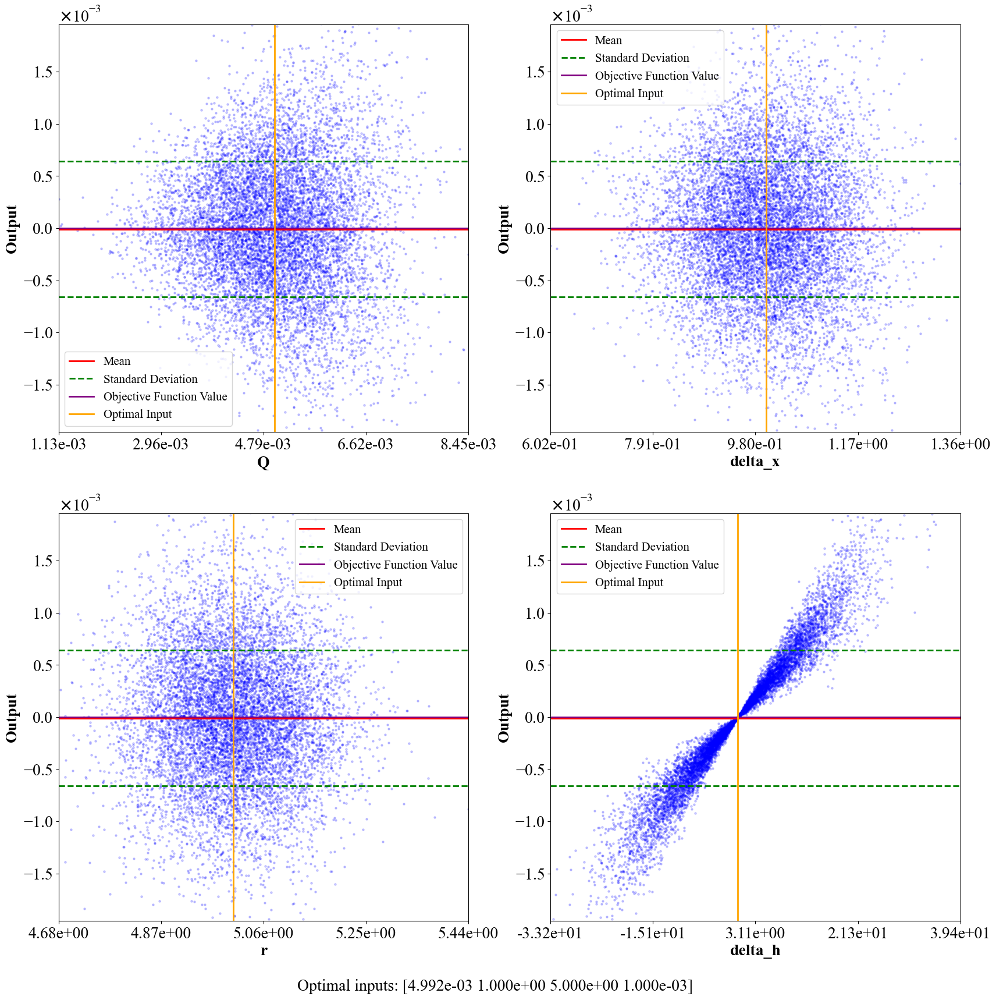

In [22]:
# STEPHANIE RINCK-PFEIFFER et al., 1999
# Define the formula as a symbolic function
formula = ['Q*(delta_x/(3.141592654*(r^2)))*delta_h']
model = ot.SymbolicFunction(['Q', 'delta_x', 'r', 'delta_h'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(0.004992, 840), #m3/d, Flowrate
          (1, 10), #m length of the column
          (1, 5), #m radius
          (0.001, 4.1)] #m hydraulic head difference
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1,0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['Q', 'delta_x', 'r', 'delta_h']

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20,weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight='bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-3*std_dev, result.fun+3*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.9)

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()

Optimal inputs: [9.8  4.39 0.34 0.09]
Objective function value: 4.4915699316628734e-05
Mean:  0.5486170208102673
Standard deviation:  0.7837101575491874
Min:  -0.00014082604068576043
Max:  7.9896759098364685


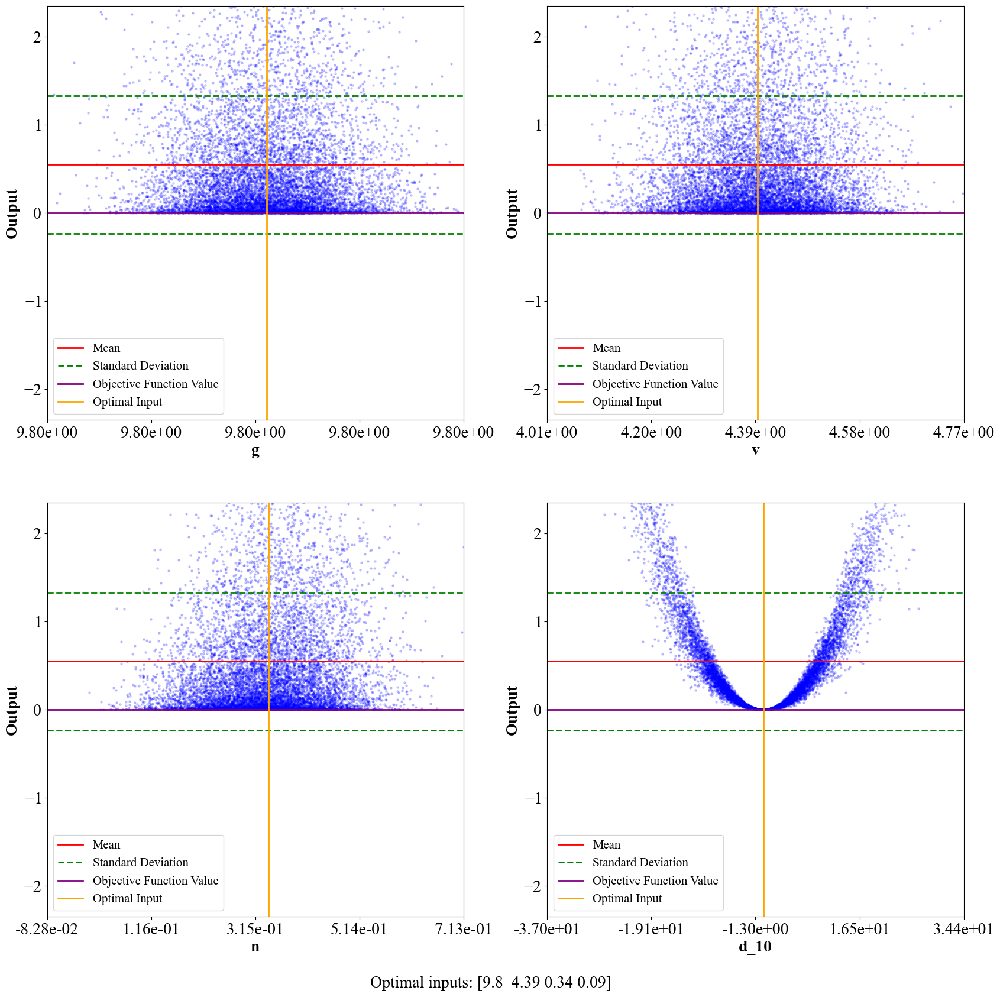

In [23]:
# Ali rifat cabalar 2016
# Define the formula as a symbolic function
formula = ['6*(10^(-4))*(g/v)*(1+10*(n-0.026))*(d_10^2)']
model = ot.SymbolicFunction(['g', 'v', 'n', 'd_10'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(9.8, 9.81),
          (1.16, 4.39),
          (0.34, 0.47),
          (0.09, 2.20)]
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1,0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['g', 'v', 'n', 'd_10']

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20,weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight='bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-3*std_dev, result.fun+3*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.9)

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])
    
# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()

Optimal inputs: [9.8        3.06424371 0.34       0.09      ]
Objective function value: 1.9400582255136813e-05
Mean:  0.4208715893831043
Standard deviation:  1.1123978835896324
Min:  3.039442854139313e-09
Max:  36.52808511423922


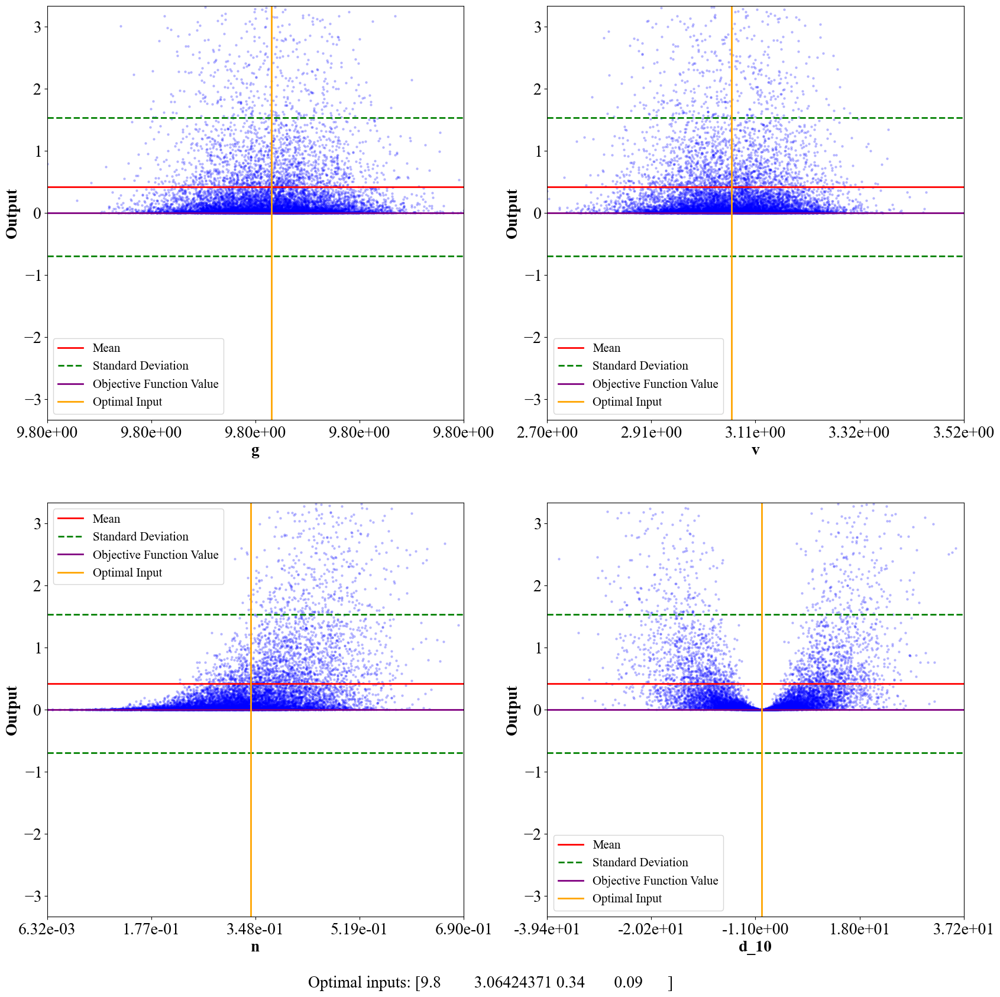

In [24]:
# Ali rifat cabalar 2016
# Define the formula as a symbolic function
formula = ['8.3*(10^(-3))*(g/v)*((n^3)/((1-n)^2))*(d_10^2)']
model = ot.SymbolicFunction(['g', 'v', 'n', 'd_10'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(9.8, 9.81),
          (1.16, 4.39),
          (0.34, 0.47),
          (0.09, 2.20)]
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1,0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['g', 'v', 'n', 'd_10']

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20,weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight='bold')

    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-3*std_dev, result.fun+3*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.9)

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()

Optimal inputs: [9.70000000e-05 3.79167111e+00 9.35000000e-01]
Objective function value: 2.7897485928201916e-05
Mean:  -2.3500579839515616e+17
Standard deviation:  2.2831191717276295e+19
Min:  -2.2820313351397137e+21
Max:  2.396759124091339e+18


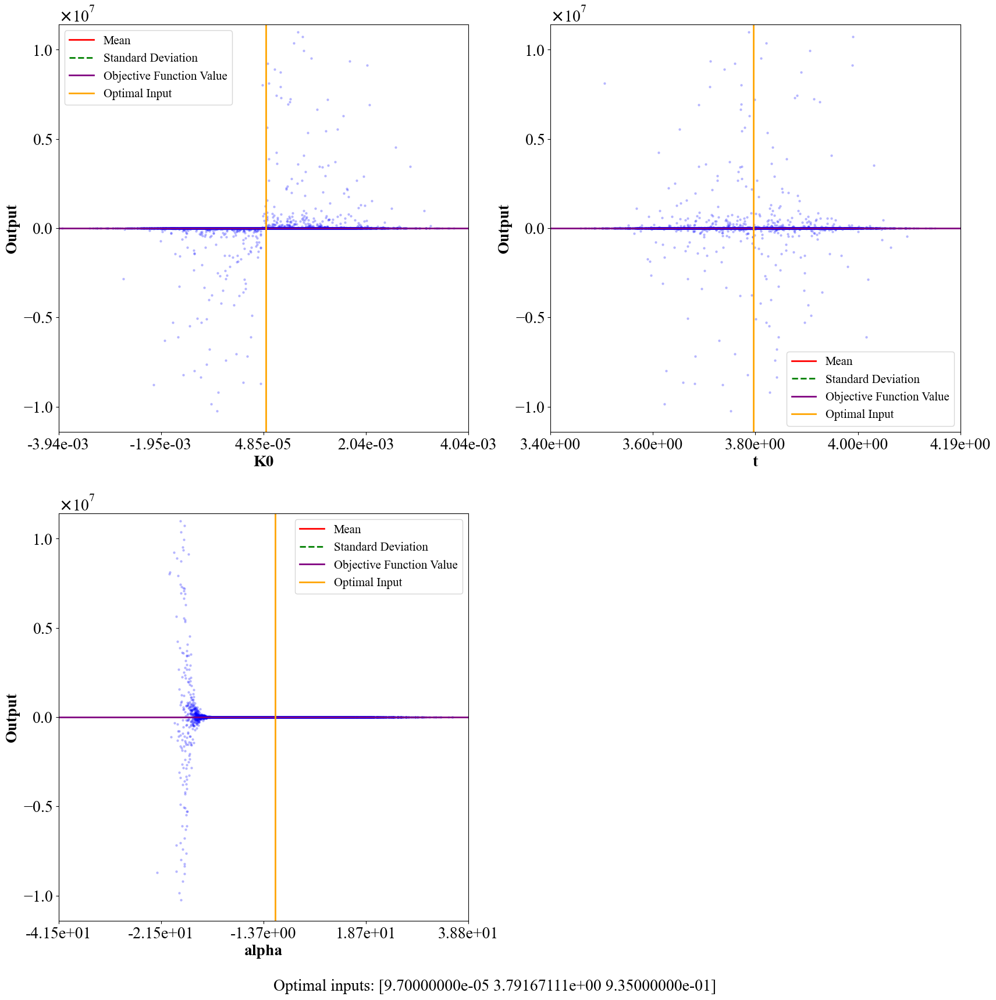

In [25]:
# Ueli Schalchli 1992
# Define the formula as a symbolic function
formula = ['K0*(t^(-alpha))']
model = ot.SymbolicFunction(['K0', 't', 'alpha'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(9.7e-5, 4.9e-3), #initial hydraulic conductivity 
          (1, 365),
          (0.328, 0.935)]# clogging exponent,
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['K0', 't', 'alpha']

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20,weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight='bold')
   
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-0.0000000000005*std_dev, result.fun+0.0000000000005*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.9)

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()

Optimal inputs: [1.00e-12 4.99e-01 1.00e-05]
Objective function value: 2.2338307903890168e-09
Mean:  nan
Standard deviation:  nan
Min:  nan
Max:  nan


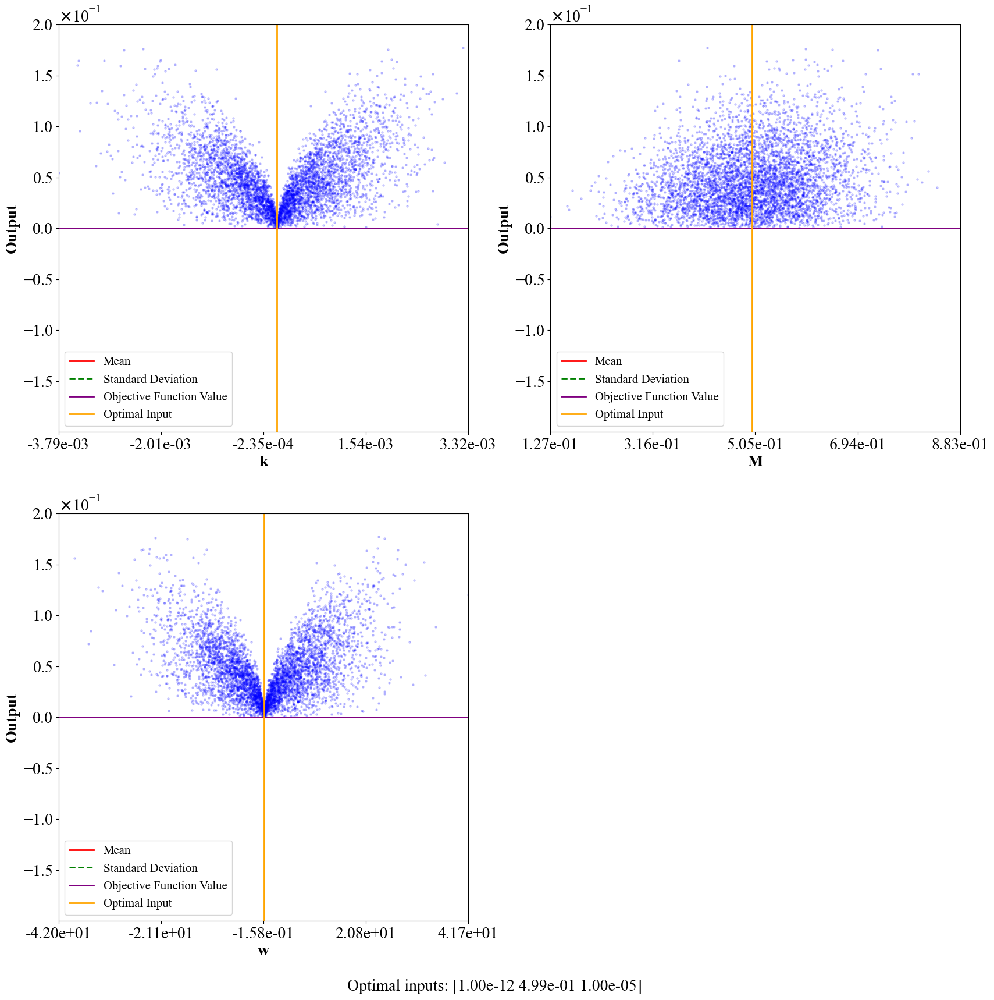

In [26]:
# Grischek et al. 2016
# Define the formula as a symbolic function
formula = ['(k*M*w)^(1/2)']
model = ot.SymbolicFunction(['k', 'M', 'w'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(1e-12, 1e0), #aquifer hydraulic conductivity (m/s)
          (0.1, 5145), # saturated thickness of aquifer below the river (m)
          (1e-5, 0.002)] # infiltration resistance (s)
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1, 10]).getSample(10000)

# Evaluate the model on the input sample
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    k, M, w = input_sample[i]
    if k * M * w < 0:
        output_sample[i, 0] = float('nan')
    else:
        output_sample[i, 0] = (k * M * w) ** 0.5

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['k', 'M', 'w']

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20,weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight='bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-0.20, result.fun+0.20]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.9)

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()

Optimal inputs: [4.99200000e-03 1.00000000e+00 5.26909941e+00 5.26909941e+00
 4.10000000e+00]
Objective function value: 4.385488080721827e-05
Mean:  1.9517875794887285e-05
Standard deviation:  0.001709987804600983
Min:  -0.05668373629001963
Max:  0.10533758415145307


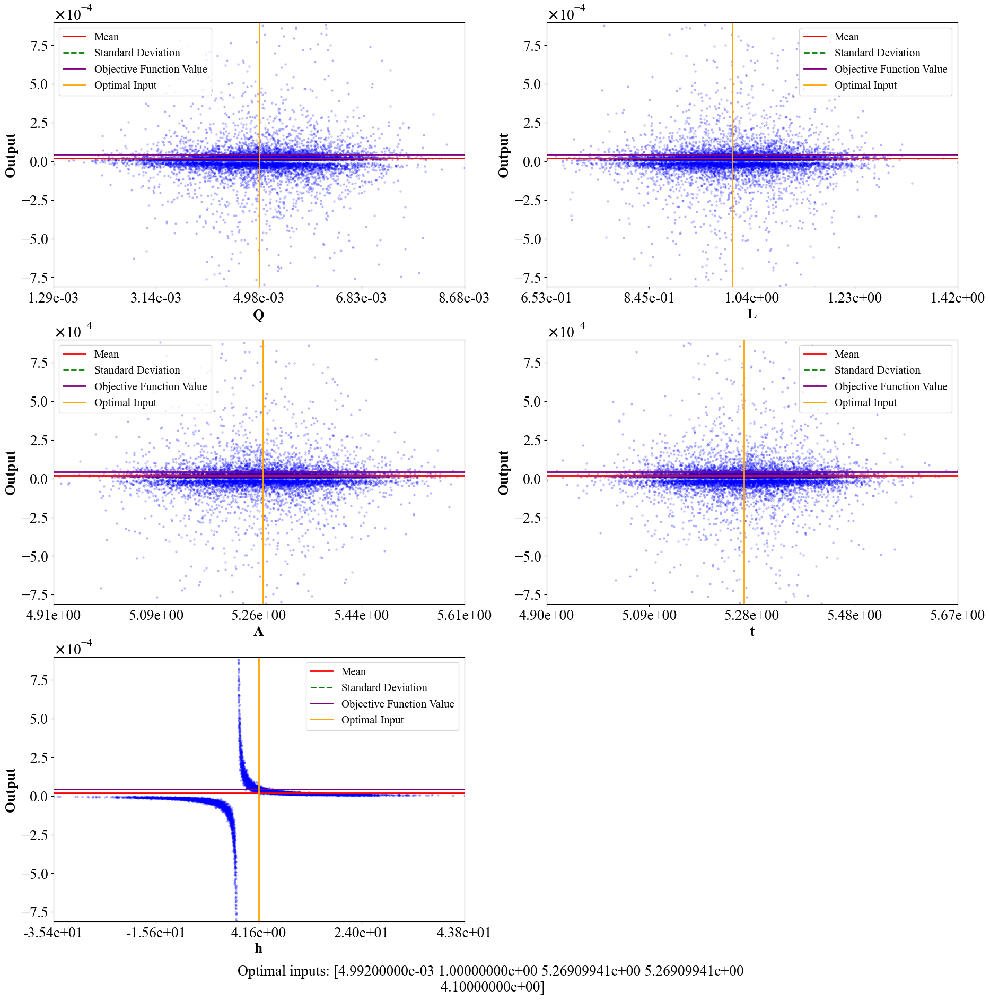

In [27]:
# Ghani et al. 2017
# Define the formula as a symbolic function
formula = ['(Q*L)/(A*t*h)']
model = ot.SymbolicFunction(['Q', 'L', 'A', 't', 'h'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(0.004992, 840), # volume of discharge (cm3)
          (1, 10), # Length of specimen (cm)
          (1, 10), # Cross sectional area of permeameter(cm2)
          (1, 365), # time for discharge (s)
          (0.001, 4.1)] # hydraulic head difference (H1-H2)
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 0.5,0.5,100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1,0.1,0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['Q', 'L', 'A', 't', 'h']

# Create subplots
fig, axs = plt.subplots(3, 2, figsize=(22, 22))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20,weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight='bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-0.5*std_dev, result.fun+0.5*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.9)

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()

Optimal inputs: [4.00e+01 9.81e+00 1.56e-02 9.35e-01 6.40e+01]
Objective function value: 2457106398.1681137
Mean:  1283679358954549.0
Standard deviation:  1.0641200327171112e+17
Min:  -1.853990410040721e+17
Max:  1.0464488600186065e+19


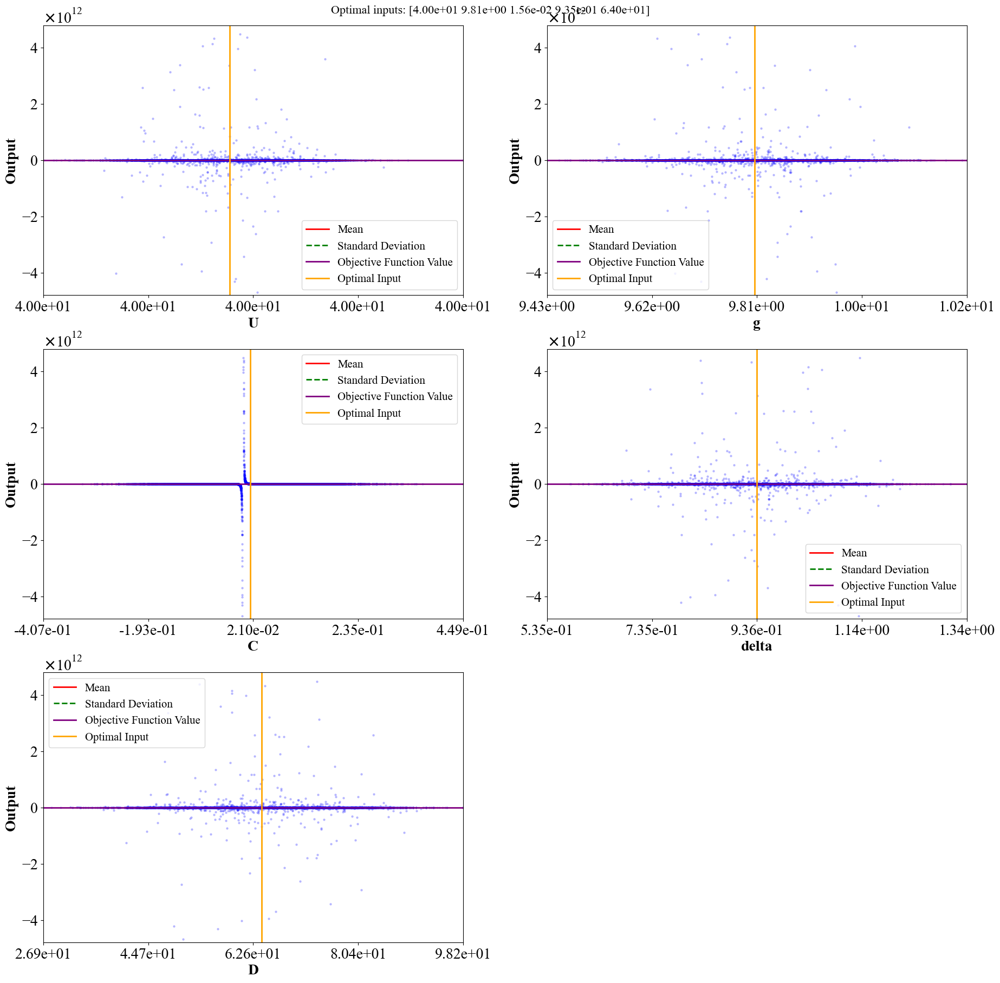

In [28]:
# Tao et al. 2019
# Define the formula as a symbolic function
formula = ['(0.05*((U)^5))/(g*((C)^3)*((delta)^2)*D)']
model = ot.SymbolicFunction(['U', 'g', 'C', 'delta', 'D'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(40, 115), # magnitude of depth‐average flow velocity (m/s)
          (9.8, 9.81), # acceleration due to gravity (m/s2)
          (0.015, 0.0156), # H1/6/n is the Chézy friction coefficient (m1/2/s), H =water depth (m), n = Manning coefficient (s/m1/3)
          (0.328, 0.935), # relative density(ρs − ρw)/ρw ρs =sediment density (kg/m3), ρw =water density (kg/m3)
          (0.02, 64)] # median grainsize (m/s)
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5, 0.5,0.5,100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1,0.1,0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['U', 'g', 'C', 'delta', 'D']

# Create subplots
fig, axs = plt.subplots(3, 2, figsize=(22, 22))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20,weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight='bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-0.000045*std_dev, result.fun+0.000045*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.9)

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.89, f"Optimal inputs: {result.x}", ha='center', fontsize=16)

# Show the plot
plt.show()

Optimal inputs: [9.70000000e-05 1.00000000e-01 1.86000011e+03]
Objective function value: 5.10639474687865e-05
Mean:  nan
Standard deviation:  nan
Min:  nan
Max:  nan


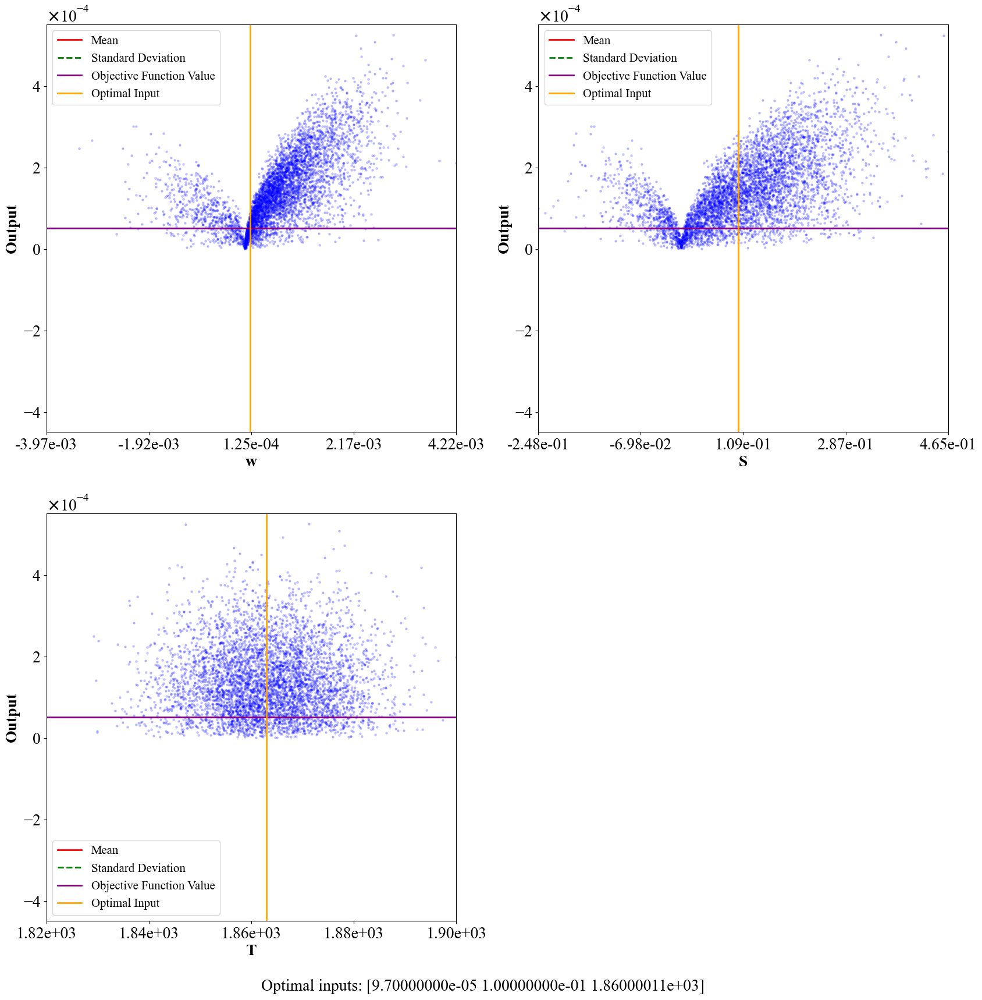

In [29]:
# Koren et al. 2021
# Define the formula as a symbolic function
formula = ['((w*S)/(2*T))^(1/2)']
model = ot.SymbolicFunction(['w', 'S', 'T'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(9.7e-5, 4.9e-3), # 
          (0.1, 50), # coefficient of aquifer elastic storativity
          (1860, 2240)] # transmissivity of aquifer
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001, 0.5,100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    w, S, T = input_sample[i]
    if ((w * S) / (2 * T)) < 0:
        output_sample[i, 0] = float('nan')
    else:
        output_sample[i, 0] = ((w * S) / (2 * T)) ** 0.5

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['w', 'S', 'T']

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20,weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight='bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-0.0005, result.fun+0.0005]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.9)

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()

Optimal inputs: [9.998e+02 9.800e+00 5.000e+00 9.350e-01 9.350e-01 2.000e-02]
Objective function value: -233.96880459317677
Mean:  -3.279153701135603
Standard deviation:  309.54352753985796
Min:  -30661.276789407802
Max:  2128.8327622241354


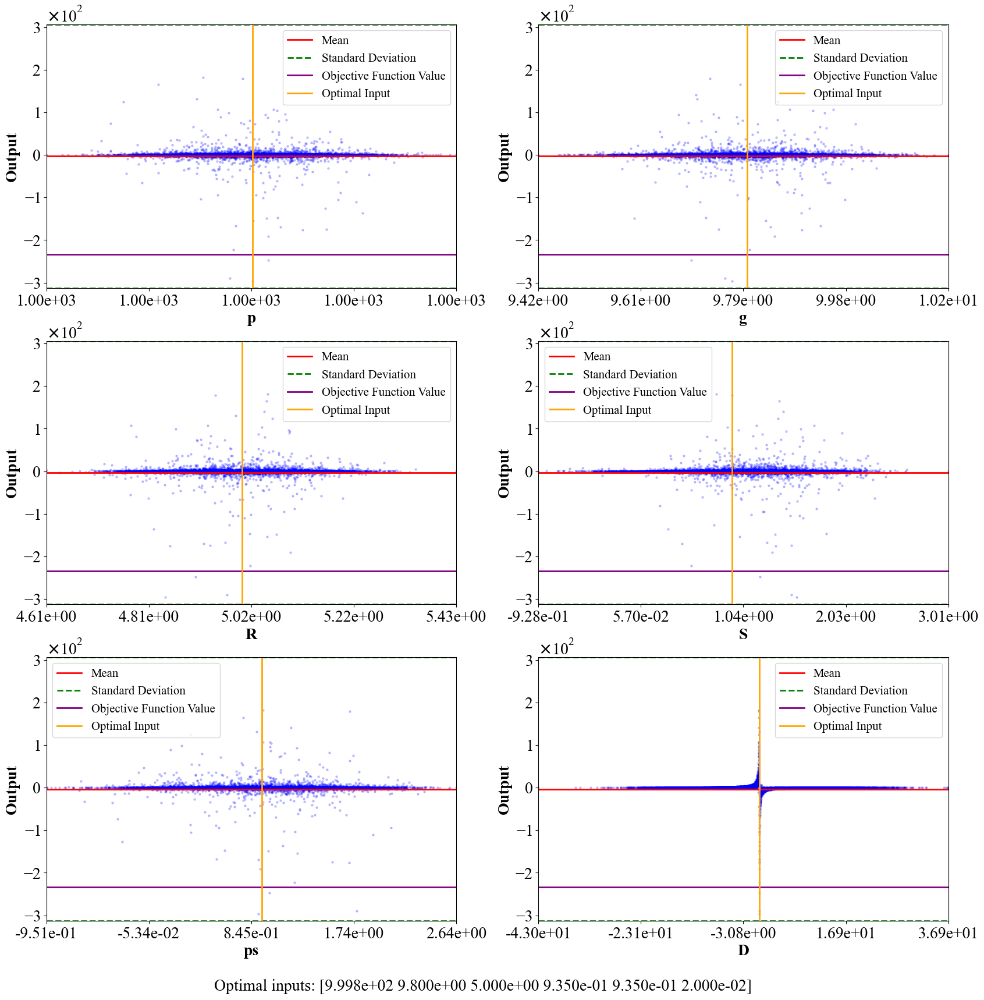

In [30]:
# Brunke 1999
# Define the formula as a symbolic function
formula = ['(p*g*R*S)/((ps-p)*g*D)']
model = ot.SymbolicFunction(['p', 'g', 'R', 'S', 'ps', 'D'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(999.8, 1000), # density of water
          (9.8, 9.81), # acceleration due to gravity
          (1, 5), # hydraulic radius
          (0.328, 0.935), # slope
          (0.328, 0.935), # density of the sediment
          (0.02, 64)] # grain size
# Use the minimize function to minimize the objective function

result = minimize(objective, x0=[0.001, 0.5,0.5,0.5,0.5,100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.1,0.1,0.5,0.5, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['p', 'g', 'R', 'S', 'ps', 'D']

# Create subplots
fig, axs = plt.subplots(3, 2, figsize=(20, 20))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20,weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight='bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([mean-1*std_dev, mean+1*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.9)

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()

Optimal inputs: [ 0.017 10.   ]
Objective function value: 0.0017000000000000001
Mean:  0.000813599465537168
Standard deviation:  0.04084104142921528
Min:  -1.4934002233257109
Max:  1.44046310010273


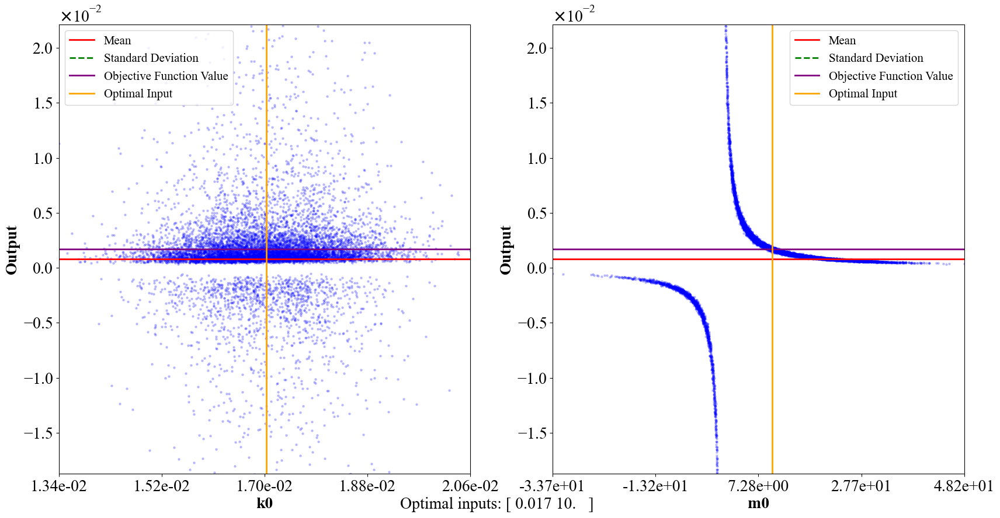

In [31]:
# Wang et al. 2015
# Define the formula as a symbolic function
formula = ['k0/m0']
model = ot.SymbolicFunction(['k0', 'm0'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(0.017, 7.13), # density of water
          (1, 10)] # grain size
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001,100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)

# Define the variable names
variable_names = ['k0', 'm0']

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20,weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight='bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-0.5*std_dev, result.fun+0.5*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.9)

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()

Optimal inputs: [9.70000000e-05 5.32832578e-01 6.64163125e-01 1.00000328e+02]
Objective function value: 8.443694329853803e-07
Mean:  -195.90136584710868
Standard deviation:  14006.299166568373
Min:  -1228414.481345706
Max:  125461.58327093921


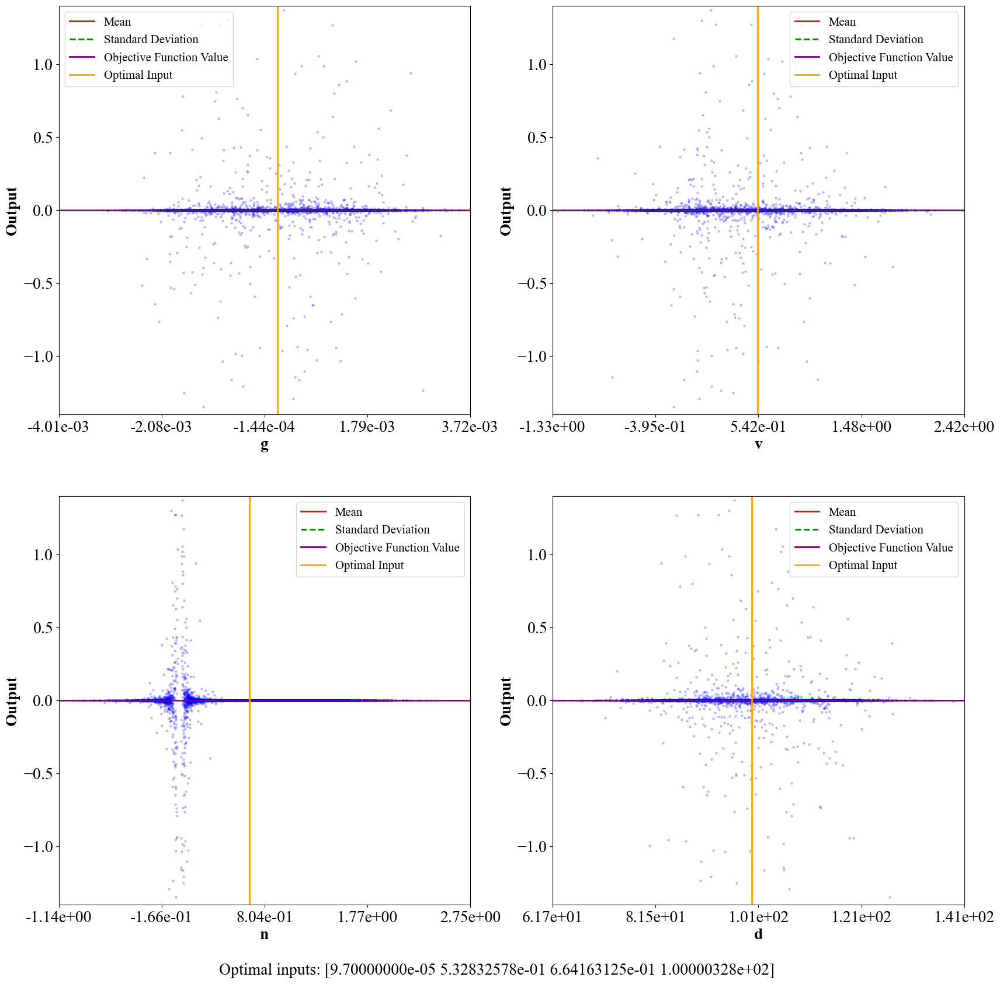

In [32]:
import openturns as ot
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize
# Cui et al. 2020

# Define the formula as a symbolic function
formula = ['g/(v*8.3e-3*((n^3)/((1-n)^2))*((d)^2))']
model = ot.SymbolicFunction(['g', 'v', 'n', 'd'], formula)

# Define the objective function as the inverse of the output of the formula
def objective(x):
    return model(x)[0]

# Define the bounds for the input variables
bounds = [(9.7e-5, 4.9e-3), # density of water
          (0.328, 0.935), # slope
          (0.328, 0.935), # density of the sediment
          (1, 365)] # grain size
# Use the minimize function to minimize the objective function
result = minimize(objective, x0=[0.001,0.5,0.5,100], bounds=bounds)

# Print the optimal input values and the corresponding objective function value
print("Optimal inputs:", result.x)
print("Objective function value:", result.fun)

# Create a sample of input values around the optimal inputs
input_sample = ot.Normal(result.x, [0.001, 0.5,0.5, 10]).getSample(10000)

# Evaluate the formula for each input
output_sample = ot.Sample(input_sample.getSize(), 1)
for i in range(input_sample.getSize()):
    output_sample[i, 0] = model(input_sample[i, :])[0]

# Compute statistics on the output
mean = output_sample.computeMean()[0]
std_dev = output_sample.computeStandardDeviation()[0]
y_min = np.min(output_sample[:, 0])
y_max = np.max(output_sample[:, 0])

print("Mean: ", mean)
print("Standard deviation: ", std_dev)
print("Min: ", y_min)
print("Max: ", y_max)
# Define the variable names
variable_names = ['g', 'v', 'n', 'd']

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs = axs.ravel()

for i in range(min(len(variable_names), len(axs))):
    ax = axs[i]
    ax.scatter(input_sample[:, i], output_sample[:, 0], s=5, c='blue', alpha=0.2)
    ax.set_xlabel(variable_names[i], fontsize=20,weight = 'bold')
    ax.set_ylabel('Output', fontsize=20, weight='bold')
    
    
    # Set x-axis and y-axis limits
    ax.set_xlim([np.min(input_sample[:, i]), np.max(input_sample[:, i])])
    ax.set_ylim([result.fun-0.0001*std_dev, result.fun+0.0001*std_dev]) # set y-axis limits
    
    # Plot mean and standard deviation lines
    ax.axhline(y=mean, color='red', linestyle='-', linewidth=2, label='Mean')
    ax.axhline(y=mean + std_dev, color='green', linestyle='--', linewidth=2, label='Standard Deviation')
    ax.axhline(y=mean - std_dev, color='green', linestyle='--', linewidth=2)

    # Plot objective function value line
    ax.axhline(y=result.fun, color='purple', linestyle='-', linewidth=2, label='Objective Function Value')

    # Plot optimal input line
    ax.axvline(x=result.x[i], color='orange', linestyle='-', linewidth=2, label='Optimal Input')
    
    # Add ticks and labels for x-axis
    xticks = np.linspace(np.min(input_sample[:, i]), np.max(input_sample[:, i]), num=5)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{tick:.2e}' for tick in xticks], rotation=0, fontsize=20)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.get_offset_text().set_fontsize(20)

    # Add ticks and labels for y-axis
    ax.tick_params(axis='y', labelsize=20)

    # Add legends
    ax.legend(fontsize=15, loc='best')

# Add a title
#fig.suptitle('Simulation Results', fontsize=24, y=0.9)

# Remove the empty subplot if the number of variables is less than the number of subplots
if len(variable_names) < len(axs):
    fig.delaxes(axs[-1])

# Display the values of 'Optimal inputs', 'Objective function value', 'Mean', and 'Standard deviation' on the graph
fig.text(0.5, 0.05, f"Optimal inputs: {result.x}", ha='center', fontsize=20)

# Show the plot
plt.show()